# CLUSTER ANALYSIS OF TISSUE DATASETS FILTERED BY CLOCK 3

In this script, a clustering analysis is performed on tissue datasets filtered by Clock 3. Three clustering methods are tested: K-means, Hierarchical Clustering, and DBSCAN. The results are visualized using scatter plots, and the performance of each method is evaluated using the silhouette score.

A comparison is also made between a "Best Overall Model" and a "Tissue-Specific Model" to determine the more effective approach. After selecting the best model, it is used to cluster the datasets, and the results are again visualized using scatter plots.

Permutation tests are conducted to assess the significance of the clusters, and additional analyses, such as Jaccard similarity and Adjusted Rand Index (ARI), are performed. CpGs identified as important during clustering are exported and saved for further analysis.

## 0. Load data and filter datasets by clocks (clock 3)

In [1]:
#### LOAD: libraries
import os
import pandas as pd
import numpy as np
import seaborn as sns

import itertools
from itertools import combinations

from pathlib import Path

import matplotlib.cm as cm  
from matplotlib import colormaps as mcolors
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, jaccard_score, davies_bouldin_score, calinski_harabasz_score, adjusted_rand_score, pairwise_distances
from sklearn.feature_selection import chi2, f_classif, mutual_info_classif
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import pairwise_distances

from scipy.spatial.distance import euclidean, pdist, squareform
from scipy.cluster.hierarchy import single, cophenet, linkage, dendrogram, fcluster
from scipy.spatial.distance import pdist, cityblock, squareform, euclidean
from scipy.stats import f_oneway

import dask.dataframe as dd
import dask.array as da
from dask import delayed, compute
from dask.distributed import Client, progress, LocalCluster
from dask.diagnostics import ProgressBar

import joblib

In [2]:
#### LOAD: Functions

###############################################

def kmeans_clustering(X, k):

    """
    Perform k-means clustering on a dataset. Also calculates silhouette score and inertia. 
    Plot the elbow plot to determine the optimal number of clusters.

    Parameters:
    - X: Dataset to cluster.
    - k: Number of clusters to create.

    """

    try:
        # Initialize k-means clustering with current parameters
        kmeans = KMeans(n_clusters=k, random_state=42)
        
        # Fit the model to the data
        kmeans.fit(X)
        
        # Calculate silhouette score to evaluate the clustering
        silhouette_avg = silhouette_score(X, kmeans.labels_)
        
        # Get inertia (sum of squared distances to the closest cluster center)
        inertia = kmeans.inertia_
        
        return [k, silhouette_avg, kmeans.cluster_centers_, kmeans.labels_, inertia]
    except Exception as e:
        return [k, None, None, None, None, str(e)]
    

###############################################

def hierarchical_clustering(X, method, metric):

    """
    Perform hierarchical clustering on a dataset. Also calculates cophenetic correlation and silhouette score.

    Parameters:
    - X: Dataset to cluster.
    - method: Linkage method to use.
    - metric: Distance metric to use.
    
    """

    try:
        # Perform hierarchical clustering
        Z = linkage(X, method=method, metric=metric)

        # Calculate the cophenetic correlation
        c, coph_dists = cophenet(Z, pdist(X))

        # Calculate the silhouette score
        labels = fcluster(Z, t=0.7 * np.max(Z[:, 2]), criterion='distance')  # Using distance criterion
        silhouette_avg = silhouette_score(X, labels)

        return ['Complete', method, metric, c, silhouette_avg, Z, labels]
    except ValueError as e:
        return ['Complete', method, metric, None, None, None, str(e)]

###############################################

# Add DBSCAN HERE

###############################################

def feature_analysis(tissue_name, dataset, labels):
    """
    Perform feature analysis on a dataset using different statistical tests.
    
    Args:
        tissue_name (str): Name of the tissue.
        dataset (pd.DataFrame): Dataset with CpGs as columns and samples as rows.
        labels (np.array): Cluster labels for each sample.
        
    Returns:
        pd.DataFrame: Feature scores and p-values for each statistical test.
    """
    
    # Convert dataset to numpy array
    X = dataset.values
    
    # Chi-squared test
    chi2_scores, chi2_pvalues = chi2(X, labels)
    
    # ANOVA F-value
    f_scores, f_pvalues = f_classif(X, labels)
    
    # Mutual Information
    mi_scores = mutual_info_classif(X, labels)
    
    # Create a dataframe with feature scores and p-values
    feature_scores = pd.DataFrame({
        'CpG': dataset.columns,
        'Chi2_Score': chi2_scores,
        'Chi2_Pvalue': chi2_pvalues,
        'F_Score': f_scores,
        'F_Pvalue': f_pvalues,
        'MI_Score': mi_scores
    })
    
    # Sort the dataframe by Chi2 score in descending order
    feature_scores = feature_scores.sort_values(by='Chi2_Score', ascending=False)
    
    return feature_scores



In [3]:
#### LOAD: Metadata
metadata = pd.read_csv('GSE223748_complete_metadata.csv')

In [4]:
#### LOAD: Complete methylation data

complete_methylation = pd.read_csv('GSE223748_datBetaNormalized.csv')
complete_methylation.rename(columns={'Unnamed: 0': 'CpG'}, inplace=True)

In [5]:
#### LOAD: Tissue-specific methylation datasets from the saved CSV files

folder_name = "Tissue Methylation"
tissue_files = os.listdir(folder_name) # Get a list of all files in the folder
tissues_df = metadata[['Sample', 'Tissue']]
tissues = tissues_df['Tissue'].unique() # Get a list of all tissues

# Load each CSV file into its own dataframe
for file in tissue_files:
    if file.endswith("_methylation_dataset.csv"):
        # Extract tissue name from file name
        tissue = file.split("_")[0]

        # Load CSV file into dataframe
        file_path = os.path.join(folder_name, file)
        globals()['{}_methylation_dataset'.format(tissue)] = pd.read_csv(file_path)

In [8]:
#### LOAD: Methylation data for the complete CpGs of each clock
# clock1 = pd.read_csv('./Clocks Methylation Data/clock1_Methylation_data_complete.csv')
# clock3 = pd.read_csv('./Clocks Methylation Data/Clock3_Methylation_data_complete.csv')
clock3 = pd.read_csv('./Clocks Methylation Data/Clock3_Methylation_data_complete.csv')
# clock3_3 = pd.read_csv('./Clocks Methylation Data/Clock3_3_Overlap_Methylation_data_complete.csv')

In [7]:
clock3.shape ### Clock

(760, 15044)

In [8]:
clock3.head() ### Clock

,CpG,202897220093_R01C01,202897220093_R02C01,202897220093_R03C01,202897220093_R04C01,202897220093_R05C01,202897220093_R06C01,202897220093_R01C02,202897220093_R02C02,202897220093_R03C02,...,206139140103_R02C02,206139140103_R03C02,206139140103_R04C02,206139140103_R05C02,206139140103_R06C02,206139140104_R01C01,206139140104_R02C01,206139140104_R03C01,206139140104_R04C01,206139140104_R05C01
0,cg26512254,0.058776,0.059387,0.055818,0.055760,0.059448,0.051183,0.052774,0.052717,0.056062,...,0.056554,0.066007,0.055089,0.057348,0.043232,0.053983,0.058618,0.056969,0.060566,0.056158
1,cg09710440,0.073836,0.075940,0.077805,0.075718,0.073214,0.075399,0.071843,0.070077,0.079597,...,0.108759,0.114258,0.109115,0.112616,0.122235,0.123950,0.111572,0.107696,0.111466,0.104929
2,cg18418719,0.993829,0.994479,0.993967,0.994156,0.993905,0.994061,0.994078,0.994131,0.993763,...,0.983000,0.983850,0.981714,0.978405,0.981733,0.982319,0.980235,0.983902,0.978931,0.983033
3,cg24352905,0.036081,0.051498,0.053750,0.044476,0.052884,0.034006,0.038629,0.034521,0.041215,...,0.059211,0.052091,0.063619,0.055042,0.054033,0.067906,0.054027,0.054988,0.069833,0.068214
4,cg05474883,0.912788,0.917133,0.913420,0.921562,0.914849,0.914164,0.920831,0.922740,0.920609,...,0.949819,0.955801,0.963495,0.965418,0.958327,0.962063,0.961395,0.961078,0.964133,0.964971


In [9]:
#### Filter the complete methylation dataset by the CpGs in clock3
clock3_cpgs = clock3['CpG'].values ### Clock
complete_methylation_dataset_clock3_filtered = complete_methylation[complete_methylation['CpG'].isin(clock3_cpgs)] ### Clock
complete_methylation_dataset_clock3_filtered.shape ### Clock

(760, 15044)

In [13]:
#### Filter the all tissues-specific datasets by the CpGs in clock 3
clock3_cpgs = clock3['CpG'].values ### Clock

for tissue in tissues:
    tissue_df = globals()['{}_methylation_dataset'.format(tissue)].copy()
    tissue_df = tissue_df[tissue_df['CpG'].isin(clock3_cpgs)] ### Clock
    globals()['{}_methylation_dataset_clock3_filtered'.format(tissue)] = tissue_df

# Note to self: the resulting variables will be named as follows: Blood_methylation_dataset_clock3_filtered

In [11]:
# Create a dataframe with the tissue names and respective filtered datasets

# List with tissue datasets
tissues = tissues_df['Tissue'].unique() # Get a list of all tissues
tissue_datasets = pd.DataFrame(columns=['Tissue', 'Dataset']) # create a dataframe to store the datasets

# List of tissues not included
tissues_not_included = []

# fill the dictionary with dataset and respective tissue name
for tissue in tissues:

    # Check that the tissue has more than 10 samples
    if metadata[metadata['Tissue'] == tissue].shape[0] < 10:
        # add tissue name to not included list
        tissues_not_included.append(tissue)
        # print(f'{tissue} has less than 10 samples and will not be included.')
    else:
        tissue_datasets.loc[len(tissue_datasets)] = [tissue, globals()['{}_methylation_dataset_clock3_filtered'.format(tissue)]] ### Clock
print('Tissues not included:', tissues_not_included)
print('Total number of tissues not included:', len(tissues_not_included))
tissue_datasets.head()

Tissues not included: ['Testis', 'Pancreas', 'Thyroid', 'Blubber', 'Ileum', 'Duodenum', 'Tendon', 'Mammary', 'TemporalCortex', 'Lamina', 'OccipitalCortex', 'ParietalCortex', 'MitralValve', 'AdrenalCortex', 'Sacrocaudalis', 'Cecum', 'Uterus', 'Jejunum', 'Larynx', 'SpinalCord', 'Suspensory', 'Cartilage', 'Astrocyte', 'Epidermis', 'Dermis', 'Maybe.Larynx']
Total number of tissues not included: 26


,Tissue,Dataset
0,Cortex,CpG 202794570001_R01C01 202794...
1,Liver,CpG 202794570002_R01C01 202794...
2,Blood,CpG 202794570002_R01C02 202794...
3,Skin,CpG 202794570010_R01C01 202794...
4,Muscle,CpG 202894750009_R02C02 202894...


Tissues with less than 10 samples were removed from the analysis.

In [12]:
# Summary of the tissues used in the analysis
print('clock 3 DATA SUMMARY') ### Clock
print('Total number of tissues:', len(tissues))
print('Number of tissues included:', tissue_datasets.shape[0])
print('Number of tissues not included:', len(tissues_not_included))
print('Tissues included not included:', tissues_not_included)


clock 3 DATA SUMMARY
Total number of tissues: 70
Number of tissues included: 44
Number of tissues not included: 26
Tissues included not included: ['Testis', 'Pancreas', 'Thyroid', 'Blubber', 'Ileum', 'Duodenum', 'Tendon', 'Mammary', 'TemporalCortex', 'Lamina', 'OccipitalCortex', 'ParietalCortex', 'MitralValve', 'AdrenalCortex', 'Sacrocaudalis', 'Cecum', 'Uterus', 'Jejunum', 'Larynx', 'SpinalCord', 'Suspensory', 'Cartilage', 'Astrocyte', 'Epidermis', 'Dermis', 'Maybe.Larynx']


In [13]:
### Clustermaps of Tissue Datasets

# Create a folder to save the results
folder = r'./Heatmap Scripts/Tissue heatmaps/Clock3' ###Clock
os.makedirs(folder, exist_ok=True)

# Iterate over the tissue datasets and generate the heatmaps
for index, row in tissue_datasets.iterrows():
    tissue_name = row['Tissue']
    tissue_dataset = row['Dataset']
    
    # Transpose the dataset
    tissue_dataset_transposed = tissue_dataset.set_index('CpG').transpose()

    # Generate the heatmap
    clustermap = sns.clustermap(tissue_dataset_transposed, 
                                cmap='RdBu_r', 
                                metric='euclidean', 
                                row_cluster=True,
                                col_cluster=True,
                                z_score=None, 
                                standard_scale=None, 
                                figsize=(10, 8), 
                                vmin=0, vmax=1,  # Set the range of values for the colormap
                                cbar_kws={'label': 'CpGs\nBeta-value', 'orientation': 'vertical'})

    # Adjust the colorbar
    clustermap.cax.set_position([.85, .7, .03, .45])  # [left, bottom, width, height] - thinner and top right
    clustermap.cax.set_aspect(2)  # Make the colorbar taller

    # Update axis labels
    clustermap.ax_heatmap.set_xlabel('CpG')
    clustermap.ax_heatmap.set_ylabel('Sample')

    # Add the title above the clustering lines
    clustermap.fig.suptitle(f'{tissue_name}', x=0.5, y=1.05, ha='center', fontsize=16, fontweight='bold')

    # plt.show()

    # Save the plot
    filepath = os.path.join(folder, f'{tissue_name}_clock3_heatmap.png') ###Clock
    try:
        clustermap.savefig(filepath)
        print(f"Saved heatmap for {tissue_name} at {filepath}")
        # if os.path.exists(filepath):
        #     print(f"File successfully created: {filepath}. Size: {os.path.getsize(filepath)} bytes")
        # else:
        #     print(f"Error: File not created at {filepath}")
    except Exception as e:
        print(f"Error saving heatmap for {tissue_name}: {str(e)}")

    # Close the plot to free up memory
    plt.close(clustermap.fig)


Saved heatmap for Cortex at ./Heatmap Scripts/Tissue heatmaps/Clock3\Cortex_clock3_heatmap.png
Saved heatmap for Liver at ./Heatmap Scripts/Tissue heatmaps/Clock3\Liver_clock3_heatmap.png
Saved heatmap for Blood at ./Heatmap Scripts/Tissue heatmaps/Clock3\Blood_clock3_heatmap.png
Saved heatmap for Skin at ./Heatmap Scripts/Tissue heatmaps/Clock3\Skin_clock3_heatmap.png
Saved heatmap for Muscle at ./Heatmap Scripts/Tissue heatmaps/Clock3\Muscle_clock3_heatmap.png
Saved heatmap for Fibroblast at ./Heatmap Scripts/Tissue heatmaps/Clock3\Fibroblast_clock3_heatmap.png
Saved heatmap for Striatum at ./Heatmap Scripts/Tissue heatmaps/Clock3\Striatum_clock3_heatmap.png
Saved heatmap for Kidney at ./Heatmap Scripts/Tissue heatmaps/Clock3\Kidney_clock3_heatmap.png
Saved heatmap for Spleen at ./Heatmap Scripts/Tissue heatmaps/Clock3\Spleen_clock3_heatmap.png
Saved heatmap for Lung at ./Heatmap Scripts/Tissue heatmaps/Clock3\Lung_clock3_heatmap.png
Saved heatmap for LymphNode at ./Heatmap Scripts/T

## 1. K-MEANS clutering of CpGs from all tissue datasets filtered by clock3

### 1.1. K-Means clustering of tissue datasets filtered by CpGs in clock 3

In [17]:
### Kmeans clustering of tissue datasets filtered by clock 3 CpGs

# Results dataframe
km_results = pd.DataFrame(columns=['Tissue', 'k', 'silhouette_score', 'cluster_centers', 'cluster_labels', 'sum_of_labels', 'total_features', 'dataset_shape'])
km_results_errors = pd.DataFrame(columns=['Tissue', 'k', 'Error'])

# Create directories to save cluster centers and labels
base_folder = './Cluster Analysis/Clustering Results/Clock3/KM/Tissue Datasets' ### Clock
os.makedirs(base_folder, exist_ok=True)

# Loop through all tissue datasets
for index, row in tissue_datasets.iterrows():
    tissue_name = row['Tissue']
    tissue_dataset = row['Dataset']

    # Transpose the dataset so that CpGs are columns and samples are rows
    tissue_dataset = tissue_dataset.set_index('CpG').transpose()

    # Get shape of the dataset
    shape = tissue_dataset.shape

    # Check if there are enough samples for clustering
    if tissue_dataset.shape[0] < 2:
        # Save the tissue name and k value that caused the error
        km_results_errors.loc[len(km_results_errors)] = [tissue_name, None, "Not enough samples for clustering"]
        continue
    
    # Split the data into training and testing sets for k-means
    X = tissue_dataset.iloc[:, :]  # All samples, all CpG features

    best_silhouette_score = -1
    best_k = None
    best_cluster_centers = None
    best_labels = None

    # Train the model and test different values of k
    k_values = range(2, 20)
    
    for k in k_values:
        try:
            # Initialize k-means clustering with current parameters
            kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
            
            # Fit the model to your data
            kmeans.fit(X)
            
            # Calculate silhouette score to evaluate the clustering
            silhouette_avg = silhouette_score(X, kmeans.labels_)

            # Update the best model if the current one is better
            if silhouette_avg > best_silhouette_score:
                best_silhouette_score = silhouette_avg
                best_k = k
                best_cluster_centers = kmeans.cluster_centers_
                # best_labels = kmeans.labels_
                best_labels = kmeans.labels_

        except ValueError as e:
            # Save the tissue name and k value that caused the error, and save the error message as string
            km_results_errors.loc[len(km_results_errors)] = [tissue_name, k, str(e)]
            continue
    
    # Save the best results for the current tissue
    if best_k is not None:
        km_results.loc[len(km_results)] = [tissue_name, best_k, best_silhouette_score, best_cluster_centers, best_labels, len(best_labels), tissue_dataset.shape[1], shape]
        
        # Save cluster centers and labels using joblib
        tissue_folder = os.path.join(base_folder, tissue_name)
        os.makedirs(tissue_folder, exist_ok=True)
        
        centers_path = os.path.join(tissue_folder, f'km_{tissue_name}_best_cluster_centers_k{best_k}_clock3.joblib') ### Clock
        labels_path = os.path.join(tissue_folder, f'km_{tissue_name}_best_cluster_labels_k{best_k}_clock3.joblib') ### Clock
        
        joblib.dump(best_cluster_centers, centers_path)
        joblib.dump(best_labels, labels_path)

# Sort results by silhouette score
km_results_tissues = km_results.sort_values(by='silhouette_score', ascending=False)

# Display the results
km_results_tissues.head()

# takes aprox 20 seconds to run

,Tissue,k,silhouette_score,cluster_centers,cluster_labels,sum_of_labels,total_features,dataset_shape
23,Keratinocyte,2,0.740124,"[[0.03767019734513177, 0.9643287300839352, 0.5...","[1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",22,760,"(22, 760)"
34,Placenta,2,0.719623,"[[0.05047569034033601, 0.940759548318044, 0.79...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",47,760,"(47, 760)"
37,ES,3,0.712821,"[[0.04539600923914045, 0.7875392652063753, 0.8...","[2, 2, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",38,760,"(38, 760)"
38,Fetus,3,0.678315,"[[0.2194215126142895, 0.9743683478499983, 0.72...","[2, 2, 2, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, ...",17,760,"(17, 760)"
40,Crypts,2,0.672016,"[[0.050307637104347686, 0.9586029979260048, 0....","[0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]",11,760,"(11, 760)"


In [18]:
km_results_errors.head()

,Tissue,k,Error
0,SVZ,19,Number of labels is 19. Valid values are 2 to ...
1,Bladder,15,Number of labels is 15. Valid values are 2 to ...
2,Bladder,16,n_samples=15 should be >= n_clusters=16.
3,Bladder,17,n_samples=15 should be >= n_clusters=17.
4,Bladder,18,n_samples=15 should be >= n_clusters=18.


In [19]:
print('Number of tissue datasets for which clustering was not done due to low number of samples:', len(km_results_errors[km_results_errors['Error'] == 'Not enough samples for clustering']))

Number of tissue datasets for which clustering was not done due to low number of samples: 0


In [20]:
print('Datasets that were not clustered due to low number of samples:\n', km_results_errors[km_results_errors['Error'] == 'Not enough samples for clustering'])
print('NOTE TO SELF: This is now empty as all tissues have more than 10 samples - filter applied at the start of the script')

Datasets that were not clustered due to low number of samples:
 Empty DataFrame
Columns: [Tissue, k, Error]
Index: []
NOTE TO SELF: This is now empty as all tissues have more than 10 samples - filter applied at the start of the script


In [21]:
print('Number of combinations for which the dataset had less samples than Ks being tested:',
      len(km_results_errors[km_results_errors['Error'].str.contains('n_clusters')]))

Number of combinations for which the dataset had less samples than Ks being tested: 57


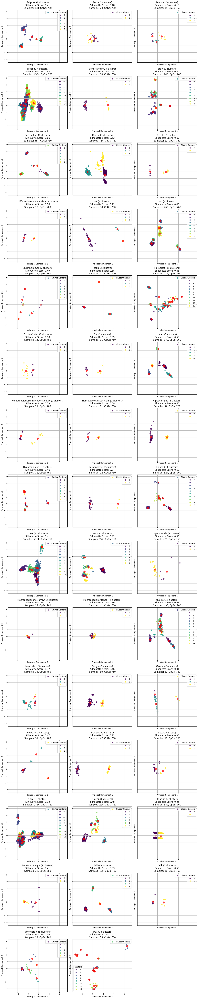

In [22]:
### Scatter plot of KM clustering of tissue datasets filtered by clock 3 CpGs - With PCA ### Clock

# Folder where scatter plots will be saved
folder = './Cluster Analysis/Clustering Results/Clock3/KM/Tissue Datasets/SCATTER PLOTS' ### Clock
os.makedirs(folder, exist_ok=True)

# Sort km_results_tissues by Tissue name
km_results_tissues = km_results_tissues.sort_values(by='Tissue')

# Create a figure with subplots for each tissue
num_tissues = len(km_results_tissues)
num_cols = 3  # Adjust the number of columns as needed
num_rows = (num_tissues - 1) // num_cols + 1

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows), sharex=True, sharey=True)
axs = axs.flatten()  # Flatten axs for easier indexing

# Loop through all tissues
subplot_idx = 0  # Keep track of the current subplot
for idx, (index, row) in enumerate(km_results_tissues.iterrows()):
    tissue_name = row['Tissue']
    
    # Ensure there is a corresponding entry in km_results
    best_k_entry = km_results_tissues[km_results_tissues['Tissue'] == tissue_name]
    if best_k_entry.empty:
        print(f"No best k value found for tissue: {tissue_name}")
        continue  # Skip this tissue if no best k value is found

    # Get the best k value and silhouette score for the tissue
    best_k = best_k_entry['k'].values[0]
    silhouette = best_k_entry['silhouette_score'].values[0]

    # Load the saved cluster centers and labels
    tissue_folder = os.path.join('./Cluster Analysis/Clustering Results/Clock3/KM/Tissue Datasets', tissue_name) ### Clock
    centers_path = os.path.join(tissue_folder, f'km_{tissue_name}_best_cluster_centers_k{best_k}_clock3.joblib') ### Clock
    labels_path = os.path.join(tissue_folder, f'km_{tissue_name}_best_cluster_labels_k{best_k}_clock3.joblib') ### Clock

    if not os.path.exists(centers_path) or not os.path.exists(labels_path):
        print(f"Files do not exist for tissue: {tissue_name}")
        continue  # Skip if the files do not exist

    cluster_centers = joblib.load(centers_path)
    labels = joblib.load(labels_path)

    # Transpose the dataset so that CpGs are columns and samples are rows
    tissue_dataset = tissue_datasets[tissue_datasets['Tissue'] == tissue_name].iloc[0]['Dataset']
    tissue_dataset = tissue_dataset.set_index('CpG').transpose()

    # Check if there are enough samples for clustering
    if tissue_dataset.shape[0] < 2:
        print(f"Not enough samples for tissue: {tissue_name}")
        continue

    # Split the data into training and testing sets for k-means
    X = tissue_dataset.iloc[:, :]  # All samples, all CpG features

    # Apply PCA to reduce to 2 dimensions
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)
    
    # Ensure cluster_centers has same structure as X
    cluster_centers_df = pd.DataFrame(cluster_centers, columns=X.columns)
    cluster_centers_pca = pca.transform(cluster_centers_df)

    # Calculate subplot position so we can access the correct axis for plotting and remove unused subplots
    ax = axs[subplot_idx]

    # Plot the data
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.75)
    ax.scatter(cluster_centers_pca[:, 0], cluster_centers_pca[:, 1], c='red', s=100, alpha=0.75)
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_title(f'{tissue_name} ({best_k} clusters)\nSilhouette Score: {silhouette:.2f}\nSamples: {tissue_dataset.shape[0]}, CpGs: {tissue_dataset.shape[1]}')
    legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
    ax.add_artist(legend1)
    ax.legend(['Cluster Centers'], loc='upper right')
    ax.grid()

    # Save the individual tissue plot
    fig_tissue, ax_tissue = plt.subplots(figsize=(8, 6))
    scatter_tissue = ax_tissue.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.75)
    ax_tissue.scatter(cluster_centers_pca[:, 0], cluster_centers_pca[:, 1], c='red', s=100, alpha=0.75)
    ax_tissue.set_xlabel('Principal Component 1')
    ax_tissue.set_ylabel('Principal Component 2')
    ax_tissue.set_title(f'{tissue_name} ({best_k} clusters)\nSilhouette Score: {silhouette:.2f}\nSamples: {tissue_dataset.shape[0]}, CpGs: {tissue_dataset.shape[1]}')
    legend_tissue = ax_tissue.legend(*scatter_tissue.legend_elements(), title="Clusters")
    ax_tissue.add_artist(legend_tissue)
    ax_tissue.legend(['Cluster Centers'], loc='upper right')
    ax_tissue.grid()
    ax_tissue.set_ylim([-2, 4])  # Set the y-axis limits for the individual plots
    ax_tissue.set_xlim([-3, 4])  # Set the x-axis limits for the individual plots
    fig_tissue.savefig(os.path.join(folder, f'{tissue_name}_scatter_plot_clock3.png')) ### Clock

    plt.close(fig_tissue)

    subplot_idx += 1

# Remove any unused subplots
for i in range(subplot_idx, len(axs)):
    axs[i].set_visible(False)

# Adjust the layout
plt.tight_layout()

# Save the combined figure
combined_plot_path = os.path.join(folder, 'combined_scatterplots_pca_kmeans_clock3.png') ### Clock
fig.savefig(combined_plot_path)

plt.show()

In [23]:
## KM Feature Analysis for each tissue dataset

# Select folder
base_folder = './Cluster Analysis/Clustering Results/Clock3/KM/Feature Analysis' ### Clock

# Perform feature analysis for each tissue
for index, row in km_results_tissues.iterrows():
    tissue_name = row['Tissue']
    labels = row['cluster_labels']

    # load the dataset
    dataset = tissue_datasets[tissue_datasets['Tissue'] == tissue_name]['Dataset'].iloc[0]

    # Transpose the dataset so that features are rows and samples are columns
    dataset = dataset.set_index('CpG').transpose()
    
    # Perform feature analysis
    feature_scores = feature_analysis(tissue_name, dataset, labels)
    
    # Save feature scores to a file
    os.makedirs(base_folder, exist_ok=True)
    output_path = os.path.join(base_folder, f'{tissue_name}_feature_scores_clock3.csv') ### Clock
    feature_scores.to_csv(output_path, index=False)

# Display the feature scores for the 
feature_scores.head()

# takes aprox 1m 50 seconds to run

,CpG,Chi2_Score,Chi2_Pvalue,F_Score,F_Pvalue,MI_Score
577,cg20804050,38.249825,0.000829,155.870131,5.613034e-30,0.776959
26,cg01019040,36.182097,0.001664,385.171044,1.575034e-37,0.754085
558,cg20076842,26.184238,0.036130,1228.290522,2.676791e-47,1.037684
717,cg26512254,26.015174,0.037863,670.056954,3.468942e-42,0.670433
370,cg13301933,25.187911,0.047476,33.575705,1.269510e-17,0.674583


## 2. Hierarchical clustering analysis of all tissue datasets filtered by clock3

### 2.1. Hierarchical clustering of tissue datasets filtered by CpGs in clock 3

HC clustering without selecting best params. instead has several eval metric so I can ort through those and check if they make any difference.

In [27]:
#### Hierarchical Clustering of tissue datasets filtered by clock 3 CpGs  --- Other eval metrics but not auto selection of best method and metric. All combinations are saved. To be used with save_best_results function().

# Initialize result dataframes
hc_results = pd.DataFrame(columns=['Tissue', 'best_method', 'best_metric', 'best_num_clusters', 'silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score', 'cluster_labels','Z'])
hc_results_errors = pd.DataFrame(columns=['Tissue', 'method', 'metric', 'num_clusters', 'error'])

# Loop through all tissue datasets
for index, row in tissue_datasets.iterrows():
    tissue_name = row['Tissue']
    tissue_dataset = row['Dataset']

    # Transpose the dataset so that CpGs are columns and samples are rows
    tissue_dataset = tissue_dataset.set_index('CpG').transpose()

    # Get shape of the dataset
    shape = tissue_dataset.shape

    # Check if there are enough samples for clustering
    if tissue_dataset.shape[0] < 2:
        # Save the tissue name and method/metric that caused the error
        hc_results_errors.loc[len(hc_results_errors)] = [tissue_name, None, None, None, "Not enough samples for clustering"]
        continue
    
    # Split the data into training and testing sets for clustering
    X = tissue_dataset.iloc[:, :]  # All samples, all CpG features

    # Train the model and test different methods of linkage and distance metrics
    methods = ['single', 'complete', 'average', 'ward']
    metrics = ['euclidean', 'cityblock', 'cosine']
    num_clusters_range = range(2, 6)  # Example range of number of clusters to test
    
    for num_clusters in num_clusters_range:
        for method in methods:
            for metric in metrics:
                
                # Ward linkage only works with Euclidean distance
                if method == 'ward' and metric != 'euclidean':
                    continue
                try:
                    # Initialize Hierarchical clustering with current parameters
                    hierarchical = AgglomerativeClustering(linkage=method, metric=metric, n_clusters=num_clusters)
                    
                    # Fit the model to your data
                    hierarchical.fit(X)
                    
                    # Calculate the evaluation metrics
                    labels = hierarchical.labels_
                    silhouette_avg = silhouette_score(X, labels)
                    davies_bouldin_avg = davies_bouldin_score(X, labels)
                    calinski_harabasz_avg = calinski_harabasz_score(X, labels)

                    # Create the linkage matrix using scipy's linkage function because we need the 4 columns for the dendrogram later
                    Z = linkage(X, method=method, metric=metric)

                    # Save the results for the current combination
                    hc_results.loc[len(hc_results)] = [
                        tissue_name, method, metric, num_clusters, silhouette_avg, 
                        davies_bouldin_avg, calinski_harabasz_avg, labels, Z
                    ]

                except ValueError as e:
                    # Save the tissue name, method, metric, and number of clusters that caused the error
                    hc_results_errors.loc[len(hc_results_errors)] = [tissue_name, method, metric, num_clusters, str(e)]
                    continue

# Sort results by silhouette score (or any other metric if desired)
hc_results_tissues = hc_results.sort_values(by='calinski_harabasz_score', ascending=False)

# Display the results
hc_results_tissues.head()

#### Takes 7 min to run

,Tissue,best_method,best_metric,best_num_clusters,silhouette_score,davies_bouldin_score,calinski_harabasz_score,cluster_labels,Z
129,Skin,ward,euclidean,2,0.221371,1.743545,815.801847,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[1906.0, 1907.0, 0.2285635757493379, 2.0], [2..."
49,Liver,ward,euclidean,2,0.329867,1.676347,633.610596,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[[1134.0, 1138.0, 0.3227648335211612, 2.0], [1..."
9,Cortex,ward,euclidean,2,0.519019,0.999646,630.242164,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[493.0, 522.0, 0.3571525500749321, 2.0], [536..."
139,Skin,ward,euclidean,3,0.237076,1.665007,588.264459,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[1906.0, 1907.0, 0.2285635757493379, 2.0], [2..."
119,Blood,ward,euclidean,5,0.233453,2.045199,563.896875,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[[2944.0, 3016.0, 0.2485320856239836, 2.0], [3..."


In [28]:
hc_results_errors.head()

,Tissue,method,metric,num_clusters,error


Running the scrip above does not automatically select the best number of clusters. It has several evaluation metrics that can be used to determine the optimal number of clusters, such as the silhouette score, the Calinski-Harabasz index, and the Davies-Bouldin index. The script also generates a dendrogram to visualize the hierarchical clustering of the samples based on the selected CpGs.

The script below saves different versions of the results, depending on the evaluation metric. This means that we can compare the results based on different evaluation metrics and choose the best clustering solution for further analysis. Particularly via dendrogram visualization, as despite having high silhouette scores initially, the clusters were not be well separated.

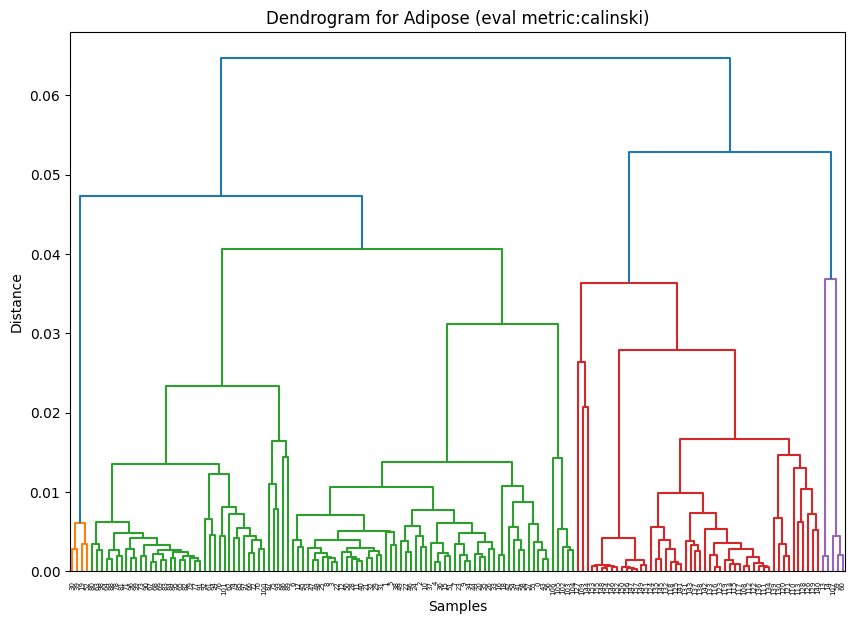

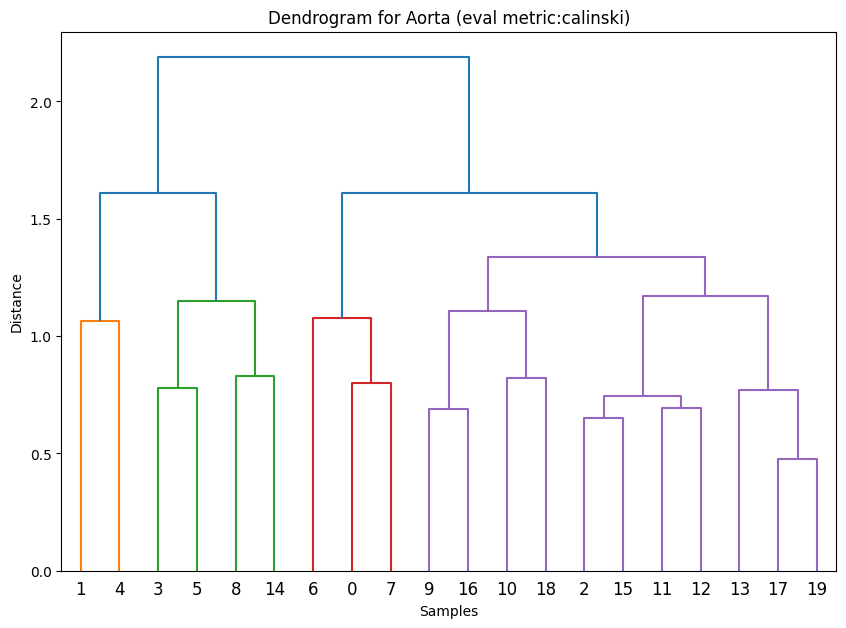

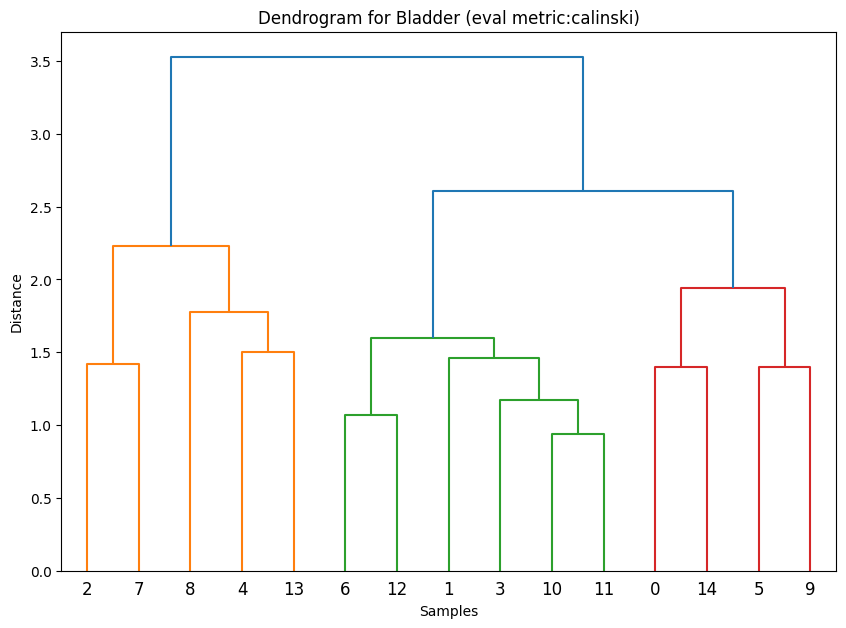

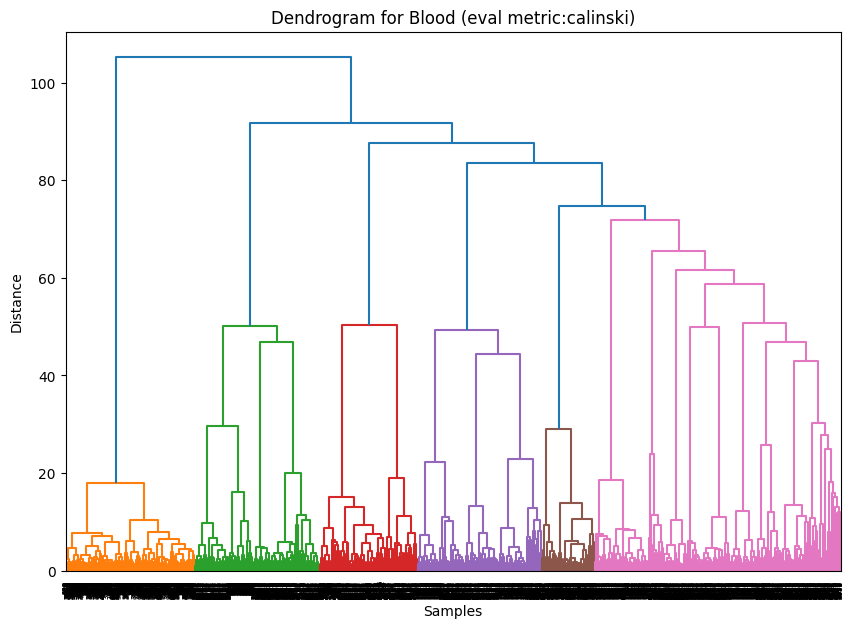

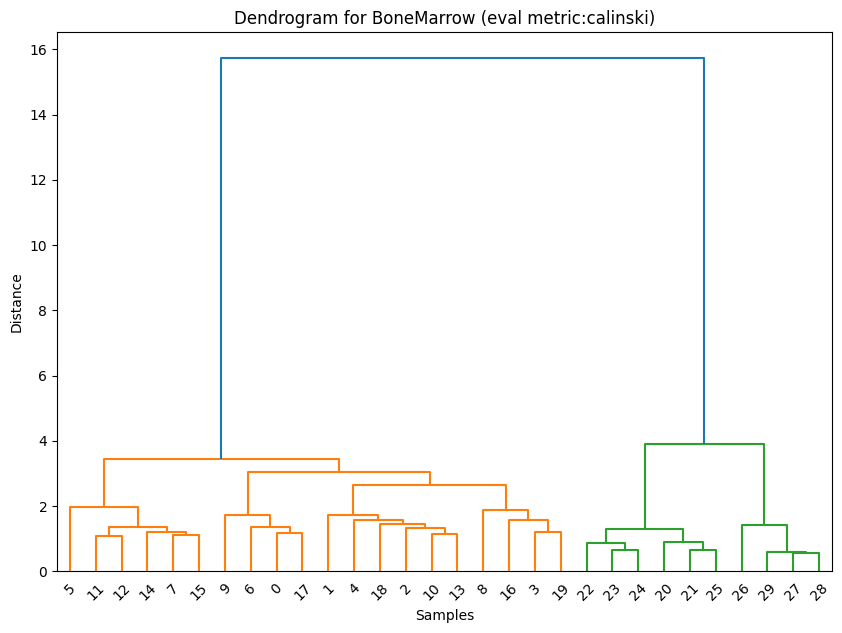

...

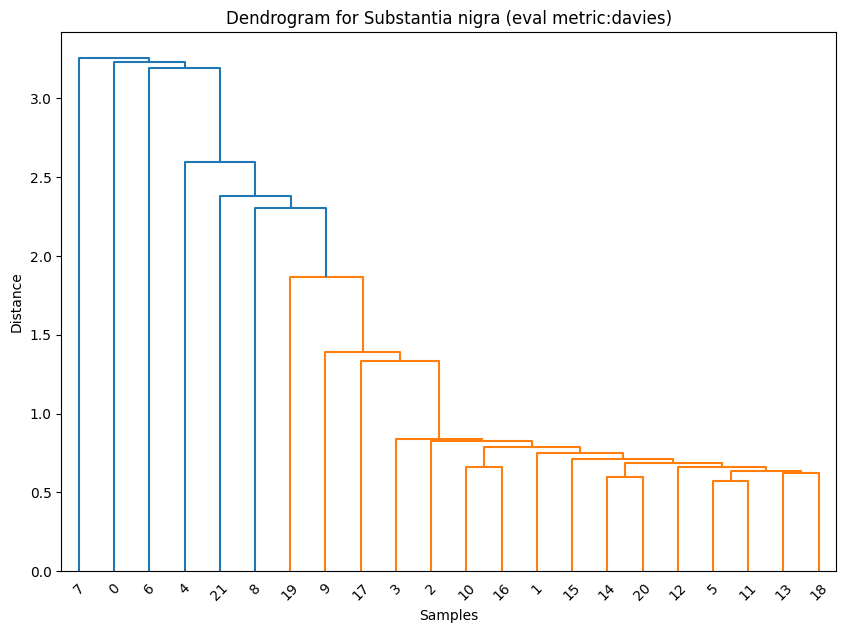

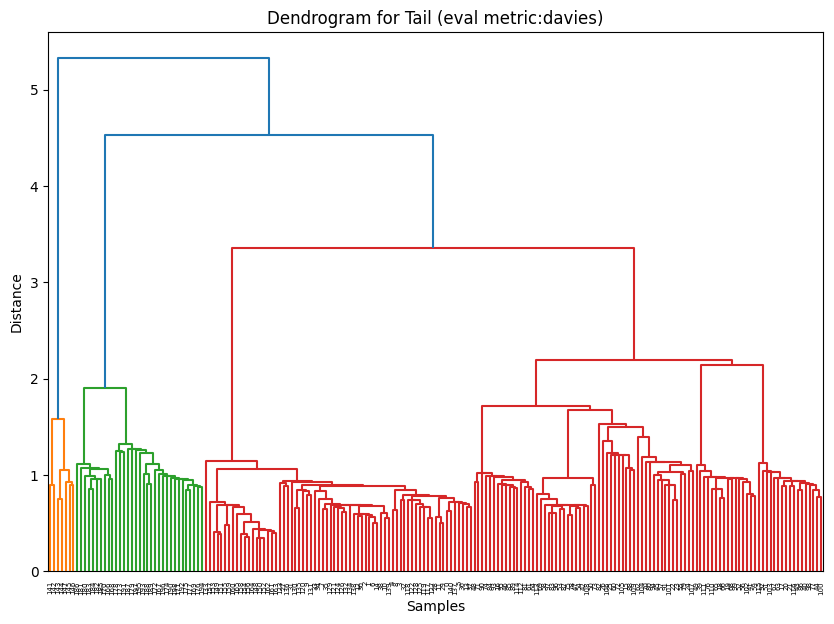

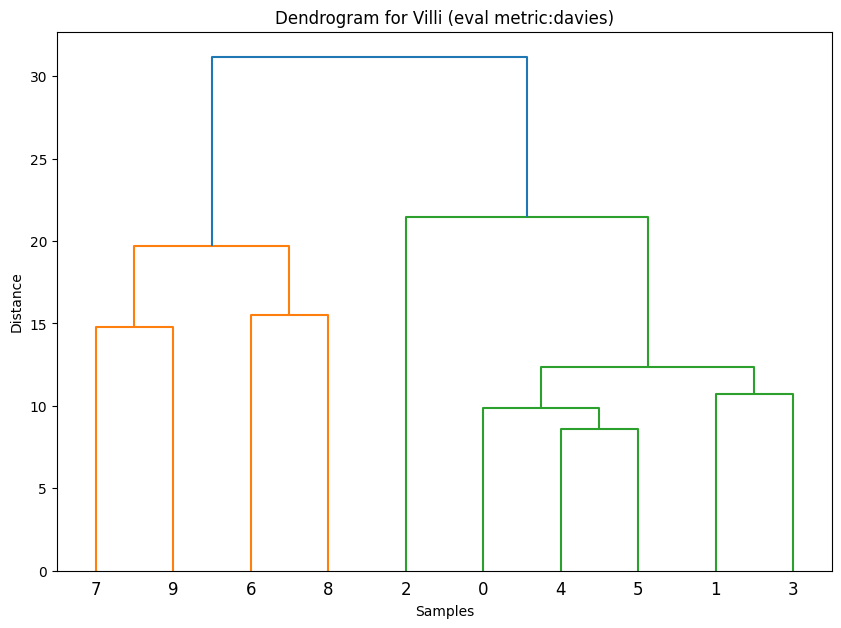

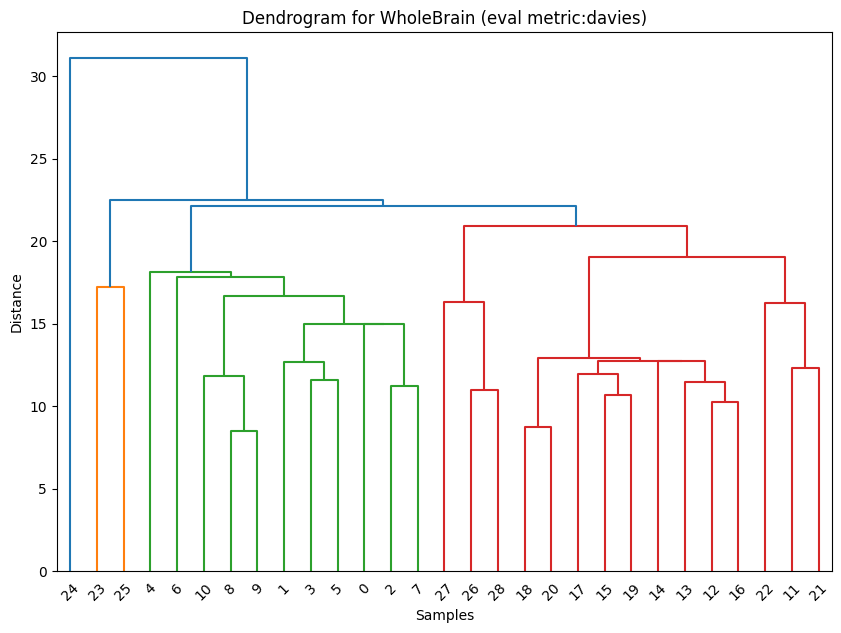

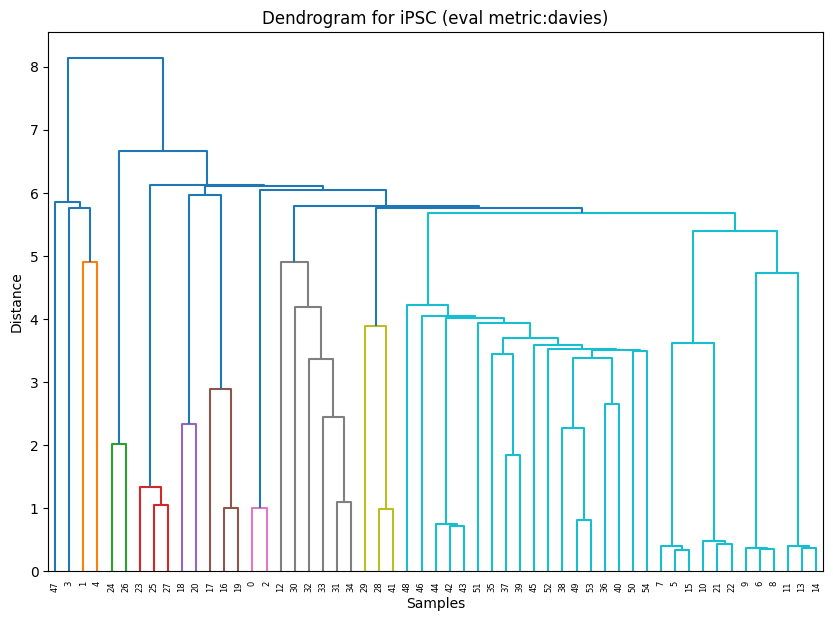

In [29]:
### Save the best results for each tissue dataset and evaluation metric

#### Save the best results for each tissue dataset and evaluation metric
#### Also saves dendrogram plots for each evaluation metric

# Folder where the 
read_folder = './Cluster Analysis/Clustering Results/Clock3/HC/Tissue Datasets' ### Clock

# Function to save best results
def save_best_results(hc_best_results, metric):
    for index, row in hc_best_results.iterrows():
        tissue_name = row['Tissue']
        Z = row['Z']
        best_num_clusters = row['cluster_labels']
        
        # Assuming 'X' is available from your dataset
        tissue_dataset = tissue_datasets[tissue_datasets['Tissue'] == tissue_name]['Dataset'].values[0]
        tissue_dataset = tissue_dataset.set_index('CpG').transpose()
        
        X = tissue_dataset
        
        # Save cluster labels and linkage matrix using joblib
        tissue_folder = os.path.join(read_folder, tissue_name)
        os.makedirs(tissue_folder, exist_ok=True)
        
        labels_path = os.path.join(tissue_folder, f'hc_{tissue_name}_best_labels_{metric}_clock3.joblib') ### Clock
        Z_path = os.path.join(tissue_folder, f'hc_{tissue_name}_best_Z_{metric}_clock3.joblib') ### Clock
        
        joblib.dump(best_num_clusters, labels_path)
        joblib.dump(Z, Z_path)

        # Visualize dendrogram
        plt.figure(figsize=(10, 7))
        plt.title(f'Dendrogram for {tissue_name} (eval metric:{metric})')
        dendrogram(Z)
        plt.xlabel('Samples')
        plt.ylabel('Distance')

        # Save the plot
        folder = './Cluster Analysis/Clustering Results/Clock3/HC/Tissue Datasets/DENDROGRAM' ### Clock
        os.makedirs(folder, exist_ok=True)
        plt.savefig(os.path.join(folder, f'hc_{tissue_name}_dendrogram_{metric}_clock3.png')) ### Clock
        plt.show()


# Sort results and save best for each metric
hc_best_results_calinski = hc_results_tissues.sort_values(by='calinski_harabasz_score', ascending=False).groupby('Tissue').first().reset_index()
save_best_results(hc_best_results_calinski, 'calinski')

hc_best_results_silhouette = hc_results_tissues.sort_values(by='silhouette_score', ascending=False).groupby('Tissue').first().reset_index()
save_best_results(hc_best_results_silhouette, 'silhouette')

hc_best_results_davies = hc_results_tissues.sort_values(by='davies_bouldin_score', ascending=True).groupby('Tissue').first().reset_index()
save_best_results(hc_best_results_davies, 'davies')

In [30]:
hc_best_results_silhouette.head()

,Tissue,best_method,best_metric,best_num_clusters,silhouette_score,davies_bouldin_score,calinski_harabasz_score,cluster_labels,Z
0,Adipose,ward,euclidean,5,0.397981,1.371937,63.520187,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, ...","[[147.0, 157.0, 0.4545898090885685, 2.0], [156..."
1,Aorta,complete,euclidean,2,0.203872,1.558815,6.012837,"[0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, ...","[[17.0, 19.0, 0.47819596302598333, 2.0], [2.0,..."
2,Bladder,average,euclidean,2,0.210321,0.597350,2.327247,"[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[[10.0, 11.0, 0.9378179722000224, 2.0], [6.0, ..."
3,Blood,average,cosine,2,0.419352,0.780157,34.268402,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[2944.0, 3016.0, 9.057052502681184e-05, 2.0],..."
4,BoneMarrow,single,cityblock,2,0.637365,0.523501,83.036221,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[[27.0, 28.0, 10.091568382158272, 2.0], [29.0,..."


In [31]:
hc_best_results_calinski.head()

,Tissue,best_method,best_metric,best_num_clusters,silhouette_score,davies_bouldin_score,calinski_harabasz_score,cluster_labels,Z
0,Adipose,complete,cosine,2,0.364480,1.233100,84.051861,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, ...","[[147.0, 157.0, 0.00033062621040635953, 2.0], ..."
1,Aorta,complete,euclidean,2,0.203872,1.558815,6.012837,"[0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, ...","[[17.0, 19.0, 0.47819596302598333, 2.0], [2.0,..."
2,Bladder,ward,euclidean,2,0.195082,1.569255,4.626053,"[0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0]","[[10.0, 11.0, 0.9378179722000224, 2.0], [6.0, ..."
3,Blood,ward,euclidean,5,0.233453,2.045199,563.896875,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[[2944.0, 3016.0, 0.2485320856239836, 2.0], [3..."
4,BoneMarrow,ward,euclidean,2,0.637365,0.523501,83.036221,"[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[[27.0, 28.0, 0.5465815367244079, 2.0], [29.0,..."


In [32]:
hc_best_results_davies.head()

,Tissue,best_method,best_metric,best_num_clusters,silhouette_score,davies_bouldin_score,calinski_harabasz_score,cluster_labels,Z
0,Adipose,single,euclidean,5,0.362226,0.813603,29.066562,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, ...","[[147.0, 157.0, 0.4545898090885685, 2.0], [156..."
1,Aorta,average,cityblock,2,0.201156,0.605921,2.343080,"[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[17.0, 19.0, 8.854436143513727, 2.0], [2.0, 1..."
2,Bladder,single,cityblock,3,0.183113,0.579357,2.469247,"[0, 0, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0]","[[10.0, 11.0, 16.277729825386473, 2.0], [6.0, ..."
3,Blood,single,cosine,2,0.419352,0.780157,34.268402,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[2944.0, 3016.0, 9.057052502681184e-05, 2.0],..."
4,BoneMarrow,single,euclidean,2,0.637365,0.523501,83.036221,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[27.0, 28.0, 0.5465815367244079, 2.0], [29.0,..."


After looking at the dendrograms produced using different eval metrics, the one that produced the best clusters was the Calinski Harabasz metric. For that reason, we will use this metric to determine the optimal number of clusters for the hierarchical clustering of the tissue datasets.

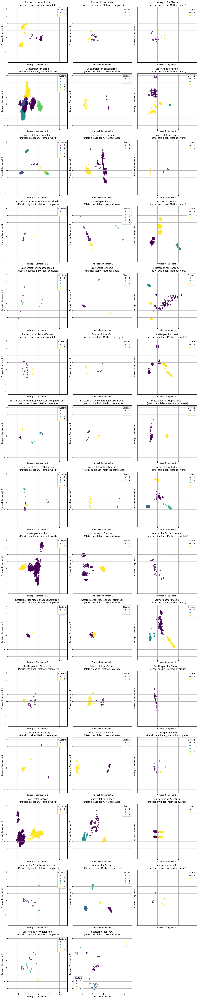

In [33]:
### Scatter plot of hierarchical clustering of tissue datasets filtered by clock 3 CpGs - With PCA

# Define the folder paths
read_folder = './Cluster Analysis/Clustering Results/Clock3/HC/Tissue Datasets' ### Clock
save_folder = './Cluster Analysis/Clustering Results/Clock3/HC/Tissue Datasets/SCATTER PLOTS' ### Clock
os.makedirs(save_folder, exist_ok=True)

# Define the evaluation metric
eval_metric = 'calinski'

# Sort hc_best_results_calinski by tissue name
hc_best_results_calinski = hc_best_results_calinski.sort_values(by='Tissue')

# Create a figure with subplots for each tissue
num_tissues = len(hc_best_results_calinski)
num_cols = 3  # Adjust the number of columns as needed
num_rows = (num_tissues - 1) // num_cols + 1

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows), sharex=True, sharey=True)
axs = axs.flatten()  # Flatten axs for easier indexing

# Loop through all tissues
subplot_idx = 0  # Keep track of the current subplot
for idx, (index, row) in enumerate(hc_best_results_calinski.iterrows()):
    tissue_name = row['Tissue']
    metric = row['best_metric']
    method = row['best_method']
    
    # Load the best labels for the current tissue
    tissue_folder = os.path.join(read_folder, tissue_name)
    labels_path = os.path.join(tissue_folder, f'hc_{tissue_name}_best_labels_{eval_metric}_clock3.joblib') ### Clock
    
    if not os.path.exists(labels_path):
        print(f"Labels file does not exist for tissue: {tissue_name}")
        continue  # Skip if the file does not exist

    labels = joblib.load(labels_path)

    # Get the dataset for the current tissue
    tissue_dataset = tissue_datasets[tissue_datasets['Tissue'] == tissue_name].iloc[0]['Dataset']
    tissue_dataset = tissue_dataset.set_index('CpG').transpose()

    # Check if there are enough samples for clustering
    if tissue_dataset.shape[0] < 2:
        print(f"Not enough samples for tissue: {tissue_name}")
        continue

    X = tissue_dataset

    # Apply PCA to reduce to 2 dimensions
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    # Plot the data
    ax = axs[subplot_idx]
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.75)
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_title(f'Scatterplot for {tissue_name} \n (Metric: {metric}, Method: {method})')
    legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
    ax.add_artist(legend1)
    ax.grid()

    # Save the individual tissue plot
    fig_tissue, ax_tissue = plt.subplots(figsize=(8, 6))
    scatter_tissue = ax_tissue.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.75)
    ax_tissue.set_xlabel('Principal Component 1')
    ax_tissue.set_ylabel('Principal Component 2')
    ax_tissue.set_title(f'Scatterplot for {tissue_name} \n (Metric: {metric}, Method: {method})')
    legend_tissue = ax_tissue.legend(*scatter_tissue.legend_elements(), title="Clusters")
    ax_tissue.add_artist(legend_tissue)
    ax_tissue.grid()
    ax_tissue.set_ylim([-2, 4])  # Set the y-axis limits for the individual plots
    ax_tissue.set_xlim([-3, 4])  # Set the x-axis limits for the individual plots
    fig_tissue.savefig(os.path.join(save_folder, f'{tissue_name}_scatter_plot_clock3.png')) ### Clock
    plt.close(fig_tissue)

    subplot_idx += 1

# Remove any unused subplots
for i in range(subplot_idx, len(axs)):
    axs[i].set_visible(False)

# Adjust the layout
plt.tight_layout()

# Save the combined figure
combined_plot_path = os.path.join(save_folder, 'combined_scatterplots_pca_calinski_clock3.png') ### Clock
fig.savefig(combined_plot_path) 

plt.show()

In [34]:
#### Feature Analysis for Hierarchical Clustering of tissue datasets filtered by clock 3 CpGs  -- Using the best clustering results based on the Calinski-Harabasz score

# Select folder
read_folder = './Cluster Analysis/Clustering Results/Clock3/HC/Tissue Datasets' ### Clock
save_folder = './Cluster Analysis/Clustering Results/Clock3/HC/Feature Analysis' ### Clock

# Evaluation metric
eval_metric = 'calinski'

# Perform feature analysis for each tissue
for index, row in hc_best_results_calinski.iterrows(): # Dataframe with the best results for specific evaluation metric
    tissue_name = row['Tissue']
    
    # Load the best labels for the current tissue
    tissue_folder = os.path.join(read_folder, tissue_name)
    labels_path = os.path.join(tissue_folder, f'hc_{tissue_name}_best_labels_{eval_metric}_clock3.joblib') ### Clock
    labels = joblib.load(labels_path)

    # Load the dataset
    dataset = tissue_datasets[tissue_datasets['Tissue'] == tissue_name]['Dataset'].iloc[0]

    # Transpose the dataset so that features are rows and samples are columns
    dataset = dataset.set_index('CpG').transpose()
    
    # Perform feature analysis
    feature_scores = feature_analysis(tissue_name, dataset, labels)
    
    # Check or create the output folder
    output_folder = os.path.join(save_folder)
    os.makedirs(output_folder, exist_ok=True)
    output_path = os.path.join(output_folder, f'{tissue_name}_feature_scores_clock3.csv') ### Clock

    # Save the feature scores to a CSV file
    feature_scores.to_csv(output_path, index=False)

# Display the feature scores for the first tissue
feature_scores.head()

,CpG,Chi2_Score,Chi2_Pvalue,F_Score,F_Pvalue,MI_Score
577,cg20804050,38.208456,2.553346e-08,956.058179,8.654777e-45,0.569030
26,cg01019040,34.559484,1.509346e-07,314.707128,7.050947e-33,0.481347
717,cg26512254,25.968058,9.685410e-06,2981.562333,2.992303e-57,0.441588
370,cg13301933,24.699224,1.784577e-05,172.143895,1.149819e-26,0.370807
729,cg26844246,21.983354,6.575341e-05,164.597362,3.241041e-26,0.491470


## 3. DBSCAN analysis of all tissue datasets filtered by clock3

### 3.1. DBSCAN clustering of tissue datasets filtered by CpGs in clock 3

In [39]:
#### DBSCAN Clustering of tissue datasets filtered by clock 3 CpGs - With Noise Removal & PCA
# keeping track of noise points, calculating the silhouette score before and after noise removal, and performing PCA    

# Results dataframe
dbscan_results = pd.DataFrame(columns=['Tissue', 'eps', 'min_samples', 'silhouette_score', 'silhouette_score_without_noise', 'n_clusters', 'core_samples', 'n_noise', 'noise_ratio', 'full_labels', 'non_noise_labels', 'total_features', 'dataset_shape'])
dbscan_results_errors = pd.DataFrame(columns=['Tissue', 'eps', 'min_samples', 'Error'])

# Create directories to save results
base_folder = './Cluster Analysis/Clustering Results/Clock3/DBSCAN/Tissue Datasets'  ### Clock
os.makedirs(base_folder, exist_ok=True)

# Function to perform DBSCAN on a single tissue dataset
@delayed
def dbscan_clustering(tissue_name, tissue_dataset):
    results = []
    errors = []

    # Check if the dataset is non-empty and then transpose the dataset
    if tissue_dataset.empty:
        errors.append([tissue_name, None, None, "Empty dataset"])
        return results, errors

    tissue_dataset = tissue_dataset.set_index('CpG').transpose()

    # Check if there are enough samples for clustering
    if tissue_dataset.shape[0] < 2:
        errors.append([tissue_name, None, None, "Not enough samples for clustering"])
        return results, errors

    # Select the data for clustering
    X = tissue_dataset.iloc[:, :]  # All samples, all CpG features

    # Calculate the max distance between samples
    max_distance = np.max(squareform(pdist(X)))

    # Train the model and test different values of epsilon and min_samples
    eps_values = np.arange(0.1 * max_distance, 1.1 * max_distance, 0.05 * max_distance)  # Adjust step size for efficiency
    min_samples_values = range(2, 10)

    best_silhouette_score = -1
    best_silhouette_score_without_noise = -1
    best_eps = None
    best_min_samples = None
    best_labels = None
    best_labels_without_noise = None
    best_n_clusters = None
    best_core_samples = None
    best_n_noise = None
    best_noise_ratio = None

    for eps in eps_values:
        for min_samples in min_samples_values:
            try:
                # Perform DBSCAN with current parameters
                dbscan = DBSCAN(eps=eps, min_samples=min_samples)
                dbscan.fit(X)

                # Check the number of clusters
                n_clusters = len(set(dbscan.labels_)) - (1 if -1 in dbscan.labels_ else 0)

                # Check the number of core samples and noise points
                core_samples = np.sum(dbscan.labels_ != -1)
                n_noise = np.sum(dbscan.labels_ == -1)
                noise_ratio = n_noise / X.shape[0]

                # Calculate Silhouette Score
                if n_clusters > 1:
                    silhouette_avg = silhouette_score(X, dbscan.labels_)
                else:
                    silhouette_avg = -1

                # Calculate Silhouette Score without noise points
                non_noise_mask = dbscan.labels_ != -1
                if n_clusters > 1 and np.any(non_noise_mask):
                    silhouette_avg_without_noise = silhouette_score(X[non_noise_mask], dbscan.labels_[non_noise_mask])
                else:
                    silhouette_avg_without_noise = -1

                # Update the best model if the current one is better
                # Consider both silhouette score and noise ratio in model selection
                if silhouette_avg > best_silhouette_score and noise_ratio < 0.5:  # Adjust threshold as needed
                    best_silhouette_score = silhouette_avg
                    best_silhouette_score_without_noise = silhouette_avg_without_noise
                    best_eps = eps
                    best_min_samples = min_samples
                    best_labels = dbscan.labels_
                    best_labels_without_noise = dbscan.labels_[non_noise_mask]
                    best_n_clusters = n_clusters
                    best_core_samples = core_samples
                    best_n_noise = n_noise
                    best_noise_ratio = noise_ratio

            except ValueError as e:
                errors.append([tissue_name, eps, min_samples, str(e)])
                continue

    # Save the best results for the current tissue
    if best_eps is not None:
        results.append([tissue_name, best_eps, best_min_samples, best_silhouette_score, 
                        best_silhouette_score_without_noise, best_n_clusters, best_core_samples, 
                        best_n_noise, best_noise_ratio, best_labels, best_labels_without_noise, 
                        X.shape[1], X.shape])
        # Keep both full labels and non-noise labels
        non_noise_mask = best_labels != -1 ### addded this
        best_labels_without_noise = best_labels[non_noise_mask] ### addded this
 
        # Save cluster labels using joblib
        tissue_folder = os.path.join(base_folder, tissue_name)
        os.makedirs(tissue_folder, exist_ok=True)

        labels_path = os.path.join(tissue_folder, f'dbscan_{tissue_name}_best_cluster_labels_eps{best_eps}_min_samples{best_min_samples}_clock3.joblib')  ### Clock
        joblib.dump(best_labels, labels_path)

        labels_path_without_noise = os.path.join(tissue_folder, f'dbscan_{tissue_name}_best_cluster_labels_eps{best_eps}_min_samples{best_min_samples}_without_noise_clock3.joblib')  ### Clock
        joblib.dump(best_labels_without_noise, labels_path_without_noise)

        # Save X without the noise points
        X_without_noise = X[non_noise_mask]
        X_without_noise_path = os.path.join(tissue_folder, f'dbscan_{tissue_name}_X_without_noise_eps{best_eps}_min_samples{best_min_samples}_clock3.joblib')  ### Clock
        joblib.dump(X_without_noise, X_without_noise_path)

        # Report noise points in the results
        print(f"Tissue: {tissue_name}")
        print(f"Number of noise points: {best_n_noise}")
        print(f"Percentage of noise points: {best_noise_ratio * 100:.2f}%")
        print(f"Silhouette score: {best_silhouette_score}")
        print(f"Silhouette score without noise: {best_silhouette_score_without_noise}")
        print("---")

    return results, errors

# Prepare delayed functions for each tissue dataset
tasks = [dbscan_clustering(row['Tissue'], row['Dataset']) for index, row in tissue_datasets.iterrows()]

# Compute the tasks in parallel
results_list = compute(*tasks)

# Combine results and errors
dbscan_results_list = [item for sublist in results_list for item in sublist[0]]
dbscan_results_errors_list = [item for sublist in results_list for item in sublist[1]]

# Convert results lists to DataFrames
dbscan_results_df = pd.DataFrame(dbscan_results_list, columns=['Tissue', 'eps', 'min_samples', 'silhouette_score', 'silhouette_score_without_noise', 'n_clusters', 'core_samples', 'n_noise', 'noise_ratio', 'full_labels', 'non_noise_labels', 'total_features', 'dataset_shape'])

dbscan_results_errors_df = pd.DataFrame(dbscan_results_errors_list, columns=['Tissue', 'eps', 'min_samples', 'Error'])

# Sort results by silhouette score
dbscan_results_tissues = dbscan_results_df.sort_values(by='silhouette_score', ascending=False)

# Display the results
dbscan_results_tissues.head()

Tissue: Neocortex
Number of noise points: 11
Percentage of noise points: 32.35%
Silhouette score: 0.2655593758378376
Silhouette score without noise: 0.45287178315818805
---
Tissue: FrontalCortex
Number of noise points: 3
Percentage of noise points: 18.75%
Silhouette score: 0.14680800440340713
Silhouette score without noise: 0.22494880353370406
---
Tissue: Aorta
Number of noise points: 9
Percentage of noise points: 45.00%
Silhouette score: 0.07553782035218952
Silhouette score without noise: 0.22159865011389004
---
Tissue: Fetus
Number of noise points: 0
Percentage of noise points: 0.00%
Silhouette score: 0.6783148963697854
Silhouette score without noise: 0.6783148963697883
---
Tissue: BoneMarrow
Number of noise points: 0
Percentage of noise points: 0.00%
Silhouette score: 0.637364810736837
Silhouette score without noise: 0.6373648107368466
---
Tissue: SVZ
Number of noise points: 0
Percentage of noise points: 0.00%
Silhouette score: 0.3201439996598838
Silhouette score without noise: 0.32

,Tissue,eps,min_samples,silhouette_score,silhouette_score_without_noise,n_clusters,core_samples,n_noise,noise_ratio,full_labels,non_noise_labels,total_features,dataset_shape
23,Keratinocyte,2.965520,2,0.740124,0.740124,2,22,0,0.0,"[0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",760,"(22, 760)"
32,Placenta,2.384979,2,0.719623,0.719623,2,47,0,0.0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",760,"(47, 760)"
35,ES,2.239587,2,0.712821,0.712821,3,38,0,0.0,"[0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...","[0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...",760,"(38, 760)"
36,Fetus,2.070217,2,0.678315,0.678315,3,17,0,0.0,"[0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, ...","[0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, ...",760,"(17, 760)"
38,Crypts,1.262370,2,0.672016,0.672016,2,11,0,0.0,"[0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]","[0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]",760,"(11, 760)"


In [40]:
# List of tissues where the noise reduction improved the silhouette score
tolerance = 1e-10
filtered_results = dbscan_results_tissues[dbscan_results_tissues["silhouette_score_without_noise"] > dbscan_results_tissues["silhouette_score"] + tolerance]
filtered_results.head()

,Tissue,eps,min_samples,silhouette_score,silhouette_score_without_noise,n_clusters,core_samples,n_noise,noise_ratio,full_labels,non_noise_labels,total_features,dataset_shape
7,Kidney,2.966669,2,0.573986,0.610396,12,312,15,0.045872,"[0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",760,"(327, 760)"
12,Heart,2.424623,2,0.551187,0.559436,7,375,4,0.010554,"[0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, ...","[0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, ...",760,"(379, 760)"
0,Cortex,3.994640,2,0.546942,0.551821,2,713,1,0.001401,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",760,"(714, 760)"
5,Fibroblast,2.116498,2,0.525979,0.650311,26,182,31,0.145540,"[-1, -1, -1, -1, -1, -1, -1, -1, 0, 0, 0, 0, 0...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, ...",760,"(213, 760)"
4,Muscle,3.284428,2,0.521398,0.537374,20,484,11,0.022222,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, ...",760,"(495, 760)"


In [41]:
# Number of tissues for which the silhouette without noise is higher than the silhouette with noise
print('The number of tissues for which the silhouete score improved after noise removal is:', len(dbscan_results_tissues[dbscan_results_tissues["silhouette_score_without_noise"] > dbscan_results_tissues["silhouette_score"]]))

The number of tissues for which the silhouete score improved after noise removal is: 34


In [42]:
# Percentage of improvement in silhouette score after noise removal
improvement = (dbscan_results_tissues["silhouette_score_without_noise"] - dbscan_results_tissues["silhouette_score"]) / dbscan_results_tissues["silhouette_score"] * 100
print(f'The average percentage improvement in silhouette score after noise removal is: {improvement.mean():.2f} %')

The average percentage improvement in silhouette score after noise removal is: 11.19 %


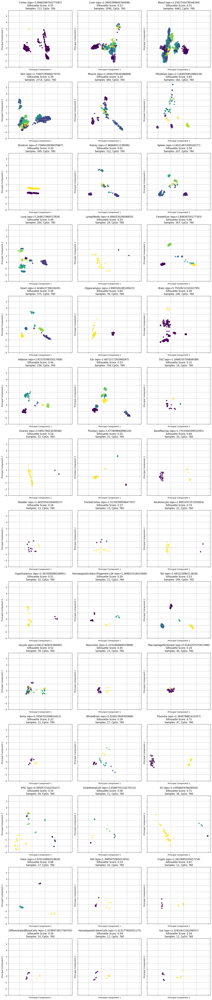

In [43]:
#### Scatter plot of DBSCAN Clustering of tissue datasets filtered by clock 3 CpGs - Noise Removal & PCA 

# Sort the DBSCAN results by tissue name
dbscan_results_tissues = dbscan_results_tissues.sort_values(by='Tissue')

# Define the folder paths
read_folder = './Cluster Analysis/Clustering Results/Clock3/DBSCAN/Tissue Datasets'  # Adjust as needed
save_folder = './Cluster Analysis/Clustering Results/Clock3/DBSCAN/Tissue Datasets/SCATTER PLOTS/Noise Removed'  # Adjust as needed
os.makedirs(save_folder, exist_ok=True)

# Create a figure with subplots for each tissue
num_tissues = len(tissue_datasets)
num_cols = 3  # Adjust the number of columns as needed
num_rows = (num_tissues - 1) // num_cols + 1

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), sharex=True, sharey=True)

# Flatten axs array
axs = axs.flatten()

# Loop through all tissues
subplot_idx = 0  # Keep track of the current subplot
for idx, (index, row) in enumerate(tissue_datasets.iterrows()):
    tissue_name = row['Tissue']

    # Ensure there is a corresponding entry in dbscan_results
    best_eps_entry = dbscan_results_tissues[dbscan_results_tissues['Tissue'] == tissue_name]
    if best_eps_entry.empty:
        continue  # Skip this tissue if no best eps value is found

    # Get the best eps value, min_samples and silhouette score for the tissue
    best_eps = best_eps_entry['eps'].values[0]
    best_min_samples = best_eps_entry['min_samples'].values[0]
    silhouette = best_eps_entry['silhouette_score_without_noise'].values[0]

    # Load the saved cluster labels
    tissue_folder = os.path.join(read_folder, tissue_name)
    labels_path = os.path.join(tissue_folder, f'dbscan_{tissue_name}_best_cluster_labels_eps{best_eps}_min_samples{best_min_samples}_without_noise_clock3.joblib')

    if not os.path.exists(labels_path):
        print('Labels file does not exist for tissue:', tissue_name)
        continue  # Skip if the file does not exist

    labels = joblib.load(labels_path)

    # Load the filtered dataset
    X_filtered_path = os.path.join(tissue_folder, f'dbscan_{tissue_name}_X_without_noise_eps{best_eps}_min_samples{best_min_samples}_clock3.joblib')
    X_filtered = joblib.load(X_filtered_path)
    X = X_filtered

    # Check if the data and labels are valid
    if X.size == 0 or labels.size == 0:
        continue  # Skip this tissue if data or labels are empty

    # Apply PCA to reduce to 2 dimensions
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    # Check if PCA transformation is successful
    if X_pca.size == 0:
        continue  # Skip this tissue if PCA results in empty data

    # Plot the data
    ax = axs[subplot_idx]
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.75)
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_title(f'{tissue_name} (eps={best_eps})\nSilhouette Score: {silhouette:.2f}\nSamples: {X.shape[0]}, CpGs: {X.shape[1]}')
    ax.grid()

    # Save the individual tissue plot
    fig_tissue, ax_tissue = plt.subplots(figsize=(8, 6))
    scatter_tissue = ax_tissue.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.75)
    ax_tissue.set_xlabel('Principal Component 1')
    ax_tissue.set_ylabel('Principal Component 2')
    ax_tissue.set_title(f'{tissue_name} (eps={best_eps})\nSilhouette Score: {silhouette:.2f}\nSamples: {X.shape[0]}, CpGs: {X.shape[1]}')
    ax_tissue.grid()
    ax_tissue.set_ylim([-2.5, 4.5])
    ax_tissue.set_xlim([-2.5, 4.5])
    fig_tissue.savefig(os.path.join(save_folder, f'{tissue_name}_scatter_plot_without_noise_clock3.png'))  ### Clock
    plt.close(fig_tissue)

    subplot_idx += 1

# Remove any unused subplots
for i in range(subplot_idx, len(axs)):
    axs[i].set_visible(False)

# Adjust the layout
plt.tight_layout()

# Save the combined figure
combined_plot_path = os.path.join(save_folder, 'combined_scatterplots_pca_dbscan_without_noise_clock3.png')  # Adjust as needed
fig.savefig(combined_plot_path)

plt.show()


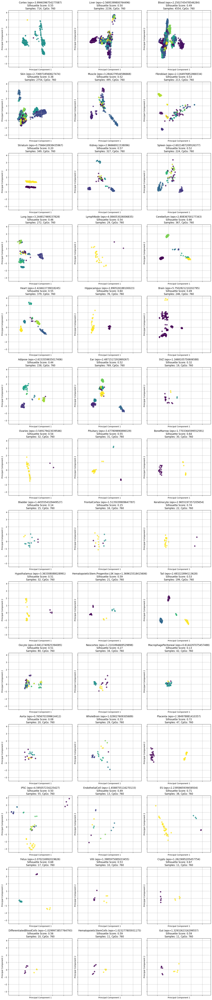

In [44]:
### Scatter plot of DBSCAN clustering of tissue datasets filtered by clock 3 CpGs - PCA & Without noise removal 

# Sort the DBSCAN results by tissue name
dbscan_results_tissues = dbscan_results_tissues.sort_values(by='Tissue')

# Define the folder paths
read_folder = './Cluster Analysis/Clustering Results/Clock3/DBSCAN/Tissue Datasets' ### Clock
save_folder = './Cluster Analysis/Clustering Results/Clock3/DBSCAN/Tissue Datasets/SCATTER PLOTS/Noise Kept' ### Clock
os.makedirs(save_folder, exist_ok=True)

# Create a figure with subplots for each tissue
num_tissues = len(tissue_datasets)
num_cols = 3  # Adjust the number of columns as needed
num_rows = (num_tissues - 1) // num_cols + 1

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows), sharex=True, sharey=True)

# Flatten axs array
axs = axs.flatten()

# Loop through all tissues
subplot_idx = 0  # Keep track of the current subplot
for idx, (index, row) in enumerate(tissue_datasets.iterrows()):
    tissue_name = row['Tissue']

    # Ensure there is a corresponding entry in dbscan_results
    best_eps_entry = dbscan_results_tissues[dbscan_results_tissues['Tissue'] == tissue_name]
    if best_eps_entry.empty:
        continue  # Skip this tissue if no best eps value is found

    # Get the best eps value and silhouette score for the tissue
    best_eps = best_eps_entry['eps'].values[0]
    best_min_samples = best_eps_entry['min_samples'].values[0]
    silhouette = best_eps_entry['silhouette_score'].values[0]

    # Load the saved cluster labels
    tissue_folder = os.path.join(read_folder, tissue_name)
    labels_path = os.path.join(tissue_folder, f'dbscan_{tissue_name}_best_cluster_labels_eps{best_eps}_min_samples{best_min_samples}_clock3.joblib') ### Clock

    if not os.path.exists(labels_path):
        continue  # Skip if the file does not exist

    labels = joblib.load(labels_path)

    # Transpose the dataset so that CpGs are columns and samples are rows
    tissue_dataset = row['Dataset'].set_index('CpG').transpose()

    # Check if there are enough samples for clustering
    if tissue_dataset.shape[0] < 2:
        continue

    X = tissue_dataset

    # Apply PCA to reduce to 2 dimensions
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    # For the filtered dataset to pass, this script needs to be modified to have this instead
    # # Filter X to remove noise points
    # non_noise_mask = full_labels != -1
    # X_filtered = X[non_noise_mask]

    # Plot the data
    ax = axs[subplot_idx]
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.75)
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_title(f'{tissue_name} (eps={best_eps})\nSilhouette Score: {silhouette:.2f}\nSamples: {tissue_dataset.shape[0]}, CpGs: {tissue_dataset.shape[1]}')
    ax.grid()

    # Save the individual tissue plot
    fig_tissue, ax_tissue = plt.subplots(figsize=(8, 6))
    scatter_tissue = ax_tissue.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', alpha=0.75)
    ax_tissue.set_xlabel('Principal Component 1')
    ax_tissue.set_ylabel('Principal Component 2')
    ax_tissue.set_title(f'{tissue_name} (eps={best_eps})\nSilhouette Score: {silhouette:.2f}\nSamples: {tissue_dataset.shape[0]}, CpGs: {tissue_dataset.shape[1]}')
    ax_tissue.grid()
    ax_tissue.set_ylim([-2.5, 4.5])
    ax_tissue.set_xlim([-2.5, 4.5])
    fig_tissue.savefig(os.path.join(save_folder, f'{tissue_name}_scatter_plot_clock3.png')) ### Clock
    plt.close(fig_tissue) 

    subplot_idx += 1

# Remove any unused subplots
for i in range(subplot_idx, len(axs)):
    axs[i].set_visible(False)

# Adjust the layout
plt.tight_layout()

# Save the combined figure
combined_plot_path = os.path.join(save_folder, 'combined_scatterplots_pca_dbscan_clock3.png') ### Clock
fig.savefig(combined_plot_path)

plt.show()

In [45]:
#### Feature Analysis for DBSCAN Clustering of tissue datasets filtered by clock 3 CpGs - With noise removal

# Select folder
read_folder = './Cluster Analysis/Clustering Results/Clock3/DBSCAN/Tissue Datasets'  ### Clock
save_folder = './Cluster Analysis/Clustering Results/Clock3/DBSCAN/Feature Analysis'  ### Clock

# Perform feature analysis for each tissue
for index, row in dbscan_results_tissues.iterrows():
    tissue_name = row['Tissue']
    
    # Load the best labels for the current tissue (without noise)
    tissue_folder = os.path.join(read_folder, tissue_name)
    labels_path = os.path.join(tissue_folder, f'dbscan_{tissue_name}_best_cluster_labels_eps{row["eps"]}_min_samples{row["min_samples"]}_without_noise_clock3.joblib') ### Clock
    labels_without_noise = joblib.load(labels_path)

    # Load the dataset without noise
    X_without_noise_path = os.path.join(tissue_folder, f'dbscan_{tissue_name}_X_without_noise_eps{row["eps"]}_min_samples{row["min_samples"]}_clock3.joblib') ### Clock 
    X_without_noise = joblib.load(X_without_noise_path)

    # Load the original dataset
    dataset = tissue_datasets[tissue_datasets['Tissue'] == tissue_name]['Dataset'].iloc[0]

    # Transpose the dataset so that features are rows and samples are columns
    dataset = dataset.set_index('CpG').transpose()
    
    # Get the non-noise samples
    non_noise_mask = row['full_labels'] != -1
    dataset_without_noise = dataset.iloc[non_noise_mask]

    # Ensure that the number of samples in dataset_without_noise matches X_without_noise
    assert dataset_without_noise.shape[0] == X_without_noise.shape[0], "Mismatch in number of samples"

    # Perform feature analysis
    feature_scores = feature_analysis(tissue_name, dataset_without_noise, labels_without_noise)
    
    # Check or create the output folder
    output_folder = os.path.join(save_folder)
    os.makedirs(output_folder, exist_ok=True)
    output_path = os.path.join(output_folder, f'{tissue_name}_feature_scores_without_noise_clock3.csv') ### Clock

    # Save the feature scores to a CSV file
    feature_scores.to_csv(output_path, index=False)

# Display the feature scores for the first tissue
feature_scores.head()


,CpG,Chi2_Score,Chi2_Pvalue,F_Score,F_Pvalue,MI_Score
558,cg20076842,24.577372,0.006207,3394.668731,4.475287e-54,0.786874
222,cg08026739,20.392825,0.025749,77.772271,1.402151e-22,0.810279
270,cg10013179,20.247844,0.026994,59.339397,1.944183e-20,0.792689
682,cg25323457,17.477077,0.064452,149.388370,7.128642e-28,1.254305
544,cg19584582,17.126819,0.071604,110.753762,1.985127e-25,0.798820


## 4. Comparing Clustering Models

### 4.1. Best Overall Model for tissue datasets (BOM)

This section compares the best clustering models from K-means, Hierarchical clustering, and DBSCAN across all tissues. The Best Overall Model (BOM) is determined based on the evaluation metrics (silhouette score). 

In [46]:
# Comparing all methods for ALL tissues (so, best method and params overall)

kmeans_df = km_results_tissues.copy()
hc_df = hc_best_results_calinski.copy()
dbscan_df = dbscan_results_tissues.copy()

# Calculate average silhouette scores
kmeans_avg_score = kmeans_df['silhouette_score'].mean()
hc_avg_score = hc_df['silhouette_score'].mean()
# dbscan_avg_score = dbscan_df['silhouette_score'].mean()
dbscan_avg_score = dbscan_df['silhouette_score_without_noise'].mean()

# Store the results in a dictionary
avg_scores = {
    'KMeans': kmeans_avg_score,
    'Hierarchical': hc_avg_score,
    'DBSCAN': dbscan_avg_score
}

# Find the best method based on average silhouette score
best_method = max(avg_scores, key=avg_scores.get)
best_score = avg_scores[best_method]

# rename the dataset if it is the best method
if best_method == 'KMeans':
    best_model_BOM = km_results_tissues.copy()
elif best_method == 'Hierarchical':
    best_model_BOM = hc_best_results_calinski.copy()
elif best_method == 'DBSCAN':
    best_model_BOM = dbscan_results_tissues.copy()
else:
    print('Error: Best method not found')

print(f"The best method overall is {best_method} with an average silhouette score of {best_score:.6f}")
print (avg_scores)

The best method overall is DBSCAN with an average silhouette score of 0.512989
{'KMeans': 0.46166817869054666, 'Hierarchical': 0.4347058688648327, 'DBSCAN': 0.5129894909978349}


In [47]:
best_model_BOM.head()

,Tissue,eps,min_samples,silhouette_score,silhouette_score_without_noise,n_clusters,core_samples,n_noise,noise_ratio,full_labels,non_noise_labels,total_features,dataset_shape
15,Adipose,2.615356,2,0.435246,0.443775,7,156,2,0.012658,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, ...",760,"(158, 760)"
30,Aorta,0.765670,2,0.075538,0.221599,2,11,9,0.450000,"[-1, -1, 0, -1, -1, -1, -1, -1, -1, 1, 0, 0, 0...","[0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0]",760,"(20, 760)"
21,Bladder,1.445555,2,0.136362,0.162160,2,13,2,0.133333,"[0, 0, 0, 0, -1, 1, 0, 0, -1, 1, 0, 0, 0, 0, 0]","[0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0]",760,"(15, 760)"
2,Blood,2.250275,4,0.491800,0.508833,46,4461,93,0.020422,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",760,"(4554, 760)"
20,BoneMarrow,1.770336,2,0.637365,0.637365,2,30,0,0.000000,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",760,"(30, 760)"


### 4.2. Best method for EACH tissue datasets (TSM)

This section compares the best clustering models from K-means, Hierarchical clustering, and DBSCAN for EACH tissue dataset. The best Tissue Specific Model (TSM) is determined based on the evaluation metrics (silhouette score).

In [48]:
### Best method for each tissue (TSM) - With and Without stability

# Define a function to calculate cluster stability
def calculate_cluster_stability(X, labels, method, params):
    np.random.seed(42)
    n_iterations = 10
    perturbation_factor = 0.1  # Adjust this factor to control the amount of perturbation

    stability_scores = []

    for _ in range(n_iterations):
        X_perturbed = X + np.random.normal(0, perturbation_factor, X.shape)
        if method == 'kmeans':
            kmeans = KMeans(n_clusters=params['k'], random_state=42)
            kmeans.fit(X_perturbed)
            new_labels = kmeans.labels_
        elif method == 'hierarchical':
            hierarchical = AgglomerativeClustering(n_clusters=params['n_clusters'], linkage=params['linkage'], metric=params['metric'])   
            new_labels = hierarchical.fit_predict(X_perturbed)
        elif method == 'dbscan':
            dbscan = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
            new_labels = dbscan.fit_predict(X_perturbed)
        
        # Check number of unique labels
        if len(set(new_labels)) > 1:
            stability_score = silhouette_score(X_perturbed, new_labels)
            stability_scores.append(stability_score)

    if stability_scores:
        return np.mean(stability_scores)
    else:
        return -1  # Return -1 if no valid silhouette scores were calculated

# Evaluate cluster stability for each method and tissue
def evaluate_clustering_methods(tissue_name, tissue_dataset):
    tissue_results = {}

    # Load the dataset 
    X = tissue_dataset

    # Evaluate KMeans
    km_tissue_result = km_results[km_results['Tissue'] == tissue_name]
    if not km_tissue_result.empty:
        best_k = km_tissue_result.iloc[0]['k']
        best_labels = km_tissue_result.iloc[0]['cluster_labels']
        km_stability = calculate_cluster_stability(X, best_labels, 'kmeans', {'k': best_k})
        km_quality = km_tissue_result.iloc[0]['silhouette_score']
        tissue_results['kmeans'] = {'stability': km_stability, 'quality': km_quality}

    # Evaluate Hierarchical Clustering
    hc_tissue_result = hc_results[hc_results['Tissue'] == tissue_name]
    if not hc_tissue_result.empty:
        best_method = hc_tissue_result.iloc[0]['best_method']
        best_metric = hc_tissue_result.iloc[0]['best_metric']
        best_num_clusters = hc_tissue_result.iloc[0]['best_num_clusters']
        best_labels = hc_tissue_result.iloc[0]['cluster_labels']
        hc_stability = calculate_cluster_stability(X, best_labels, 'hierarchical', {'n_clusters': best_num_clusters, 'linkage': best_method, 'metric': best_metric})
        hc_quality = hc_tissue_result.iloc[0]['silhouette_score']
        tissue_results['hierarchical'] = {'stability': hc_stability, 'quality': hc_quality}

    # Evaluate DBSCAN
    dbscan_tissue_result = dbscan_results[dbscan_results['Tissue'] == tissue_name]
    if not dbscan_tissue_result.empty:
        best_eps = dbscan_tissue_result.iloc[0]['eps']
        best_min_samples = dbscan_tissue_result.iloc[0]['min_samples']
        best_labels = dbscan_tissue_result.iloc[0]['non_noise_labels'] # checking if better to use non noise labels
        X_dbscan = joblib.load(os.path.join('./Cluster Analysis/Clustering Results/Clock3/DBSCAN/Tissue Datasets', tissue_name, f'dbscan_{tissue_name}_X_without_noise_eps{best_eps}_min_samples{best_min_samples}_clock3.joblib')) ### Clock
        dbscan_stability = calculate_cluster_stability(X_dbscan, best_labels, 'dbscan', {'eps': best_eps, 'min_samples': best_min_samples})
        dbscan_quality = dbscan_tissue_result.iloc[0]['silhouette_score']
        tissue_results['dbscan'] = {'stability': dbscan_stability, 'quality': dbscan_quality}

    return tissue_results

# Function to determine the best method based on stability and quality
def determine_best_method(tissue_results, include_stability=True):
    best_method = None
    best_score = -np.inf

    for method, scores in tissue_results.items():
        if include_stability:
            combined_score = scores['stability'] + scores['quality']
        else:
            combined_score = scores['quality']
        if combined_score > best_score:
            best_score = combined_score
            best_method = method

    return best_method, best_score

# Function to visualize the clusters
def visualize_clusters(X, tissue, labels, title, folder):
    try:
        # Reduce dimensionality with PCA for visualization
        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(X)

        # Ensure labels match the number of samples
        if len(labels) != X_pca.shape[0]:
            print(f"Error: Number of labels {len(labels)} in tissue {tissue} does not match number of PCA samples {X_pca.shape[0]}")
            return
        
        # Plot the clusters
        fig, ax = plt.subplots(figsize=(8, 6))
        scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis', s=50, alpha=0.7)
        ax.set_title(title)
        ax.set_xlabel('PCA Component 1')
        ax.set_ylabel('PCA Component 2')
        plt.colorbar(scatter)
        
        # Save the plot
        os.makedirs(folder, exist_ok=True)
        plot_path = os.path.join(folder, f'{title}.png')
        plt.savefig(plot_path, bbox_inches='tight')

        # Display the plot
        plt.show()

    except Exception as e:
        print(f"An error occurred during visualization: {e}")

# Load the tissue datasets
km_results = km_results_tissues.copy()
hc_results = hc_best_results_calinski.copy()
dbscan_results = dbscan_results_tissues.copy()

# Main evaluation loop
final_results = []

for index, row in tissue_datasets.iterrows():
    tissue_name = row['Tissue']
    tissue_dataset = row['Dataset']
    tissue_dataset = tissue_dataset.set_index('CpG').transpose()

    if tissue_dataset.shape[0] < 2:
        print(f"Skipping {tissue_name} due to insufficient samples")   
        continue

    tissue_results = evaluate_clustering_methods(tissue_name, tissue_dataset)
    final_results.append({'Tissue': tissue_name, 'Results': tissue_results})

# Determine the best method for each tissue
best_methods_with_stability = []
best_methods_without_stability = []

for result in final_results:
    tissue_name = result['Tissue']
    tissue_results = result['Results']
    
    best_method_with_stability, best_score_with_stability = determine_best_method(tissue_results, include_stability=True)
    best_methods_with_stability.append({'Tissue': tissue_name, 'Best_Method': best_method_with_stability, 'Combined Score': best_score_with_stability})

    best_method_without_stability, best_score_without_stability = determine_best_method(tissue_results, include_stability=False)
    best_methods_without_stability.append({'Tissue': tissue_name, 'Best_Method': best_method_without_stability, 'Quality Score': best_score_without_stability})

# Convert to DataFrames and display results
best_models_with_stability = pd.DataFrame(best_methods_with_stability)
best_models_without_stability = pd.DataFrame(best_methods_without_stability)

print("Best Methods Considering Stability and Quality:")
print(best_models_with_stability.head())
print('')
print("Best Methods Considering Only Quality:")
print(best_models_without_stability.head())
print('')
print('')
# Number of tissues for each model
print("Number of tissues for each model (with stability):")
print(best_models_with_stability['Best_Method'].value_counts())
print('')
print("Number of tissues for each model (without stability):")
print(best_models_without_stability['Best_Method'].value_counts())


Best Methods Considering Stability and Quality:
   Tissue   Best_Method  Combined Score
0  Cortex  hierarchical        0.727626
1   Liver  hierarchical        0.481871
2   Blood        kmeans        0.601195
3    Skin        kmeans        0.430764
4  Muscle  hierarchical        0.614905

Best Methods Considering Only Quality:
   Tissue Best_Method  Quality Score
0  Cortex      dbscan       0.546942
1   Liver      dbscan       0.497337
2   Blood      dbscan       0.491800
3    Skin      dbscan       0.379497
4  Muscle      dbscan       0.521398


Number of tissues for each model (with stability):
Best_Method
hierarchical    22
kmeans          21
dbscan           1
Name: count, dtype: int64

Number of tissues for each model (without stability):
Best_Method
dbscan          19
kmeans          19
hierarchical     6
Name: count, dtype: int64


The best overall model (BOM) turned out to be DBSCAN. However, after running the tissue specific model (TSM) script to find the particular best method for each tissue dataset, only one dataset was found to be best with DBSCAN. I decided to revise the TSM script to find the best model for each dataset using 1. silhouette score + stabilibility and 2. just silhouette score:

Number of tissues for each model (with stability):   
Best_Method     
hierarchical    22    
kmeans          21   
dbscan           1   


Number of tissues for each model (without stability):    
Best_Method   
dbscan          19   
kmeans          19   
hierarchical     6   

When considering both stability and quality, hierarchical clustering and k-means are preferred for most tissues (22 and 21 respectively), with DBSCAN being the least favored (1 tissue). However, when only quality is considered, DBSCAN and k-means are equally preferred (19 tissues each), while hierarchical clustering is less favored (6 tissues).

Contrary to the BOM approach, DBSCAN is not favored when considering stability because its performance can be highly sensitive to slight perturbations in the data. The algorithm's reliance on density-based parameters (eps and min_samples) makes it less stable when the dataset is slightly modified, leading to less consistent clustering results. This sensitivity reduces its stability score, making it less favored compared to hierarchical clustering and k-means, which tend to produce more stable clusters under similar perturbations.

We will move forward using the stability param to determine the best clustering method for each tissue dataset.

In [49]:
### The Best method for each tissue (TSM)
best_models_TSM = best_models_with_stability.copy()
best_models_TSM.head()

,Tissue,Best_Method,Combined Score
0,Cortex,hierarchical,0.727626
1,Liver,hierarchical,0.481871
2,Blood,kmeans,0.601195
3,Skin,kmeans,0.430764
4,Muscle,hierarchical,0.614905


In [50]:
# Number of tissues for each model
best_models_TSM['Best_Method'].value_counts()

Best_Method
hierarchical    22
kmeans          21
dbscan           1
Name: count, dtype: int64

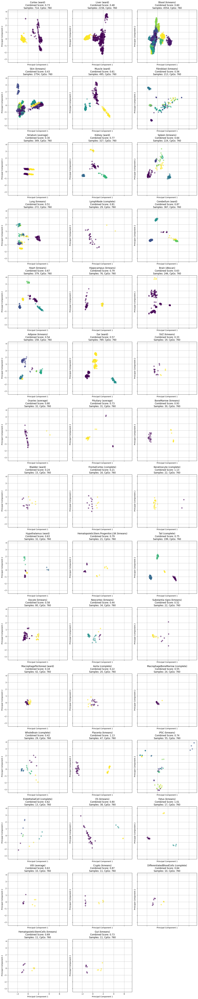

In [51]:
# Plotting the best method for each tissue (TSM) 

# Load the best models DataFrame
best_models_TSM = best_models_with_stability.copy()

# Define the folder paths
read_folder = './Cluster Analysis/Clustering Results/Clock3'  # Adjust as needed
save_folder = './Cluster Analysis/Clustering Results/Clock3/TSM_SCATTER_PLOTS/Best Models'  # Adjust as needed
os.makedirs(save_folder, exist_ok=True)

# Create a figure with subplots for each tissue
num_tissues = len(tissue_datasets)
num_cols = 3  # Adjust the number of columns as needed
num_rows = (num_tissues - 1) // num_cols + 1

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), sharex=True, sharey=True)

# Flatten axs array
axs = axs.flatten()

# Loop through all tissues based on the best models DataFrame
for subplot_idx, (index, row) in enumerate(best_models_TSM.iterrows()):
    tissue_name = row['Tissue']
    best_method = row['Best_Method']
    combined_score = row['Combined Score']  # Get the combined score for the title

    # Load the tissue dataset
    tissue_dataset_row = tissue_datasets[tissue_datasets['Tissue'] == tissue_name]
    if tissue_dataset_row.empty:
        continue
    tissue_dataset = tissue_dataset_row.iloc[0]['Dataset'].set_index('CpG').transpose()

    if tissue_dataset.shape[0] < 2:
        print(f"Skipping {tissue_name} due to insufficient samples")
        continue

    # Determine the best model and parameters
    if best_method == 'kmeans':
        km_tissue_result = km_results[km_results['Tissue'] == tissue_name]
        best_k = km_tissue_result.iloc[0]['k']
        best_labels = km_tissue_result.iloc[0]['cluster_labels']
        params = {'k': best_k}
    elif best_method == 'hierarchical':
        hc_tissue_result = hc_results[hc_results['Tissue'] == tissue_name]
        best_method = hc_tissue_result.iloc[0]['best_method']
        best_metric = hc_tissue_result.iloc[0]['best_metric']
        best_num_clusters = hc_tissue_result.iloc[0]['best_num_clusters']
        best_labels = hc_tissue_result.iloc[0]['cluster_labels']
        params = {'n_clusters': best_num_clusters, 'linkage': best_method, 'metric': best_metric}
    elif best_method == 'dbscan':
        dbscan_tissue_result = dbscan_results[dbscan_results['Tissue'] == tissue_name]
        best_eps = dbscan_tissue_result.iloc[0]['eps']
        best_min_samples = dbscan_tissue_result.iloc[0]['min_samples']
        best_labels = dbscan_tissue_result.iloc[0]['non_noise_labels']  # Non-noise labels
        X_dbscan = joblib.load(os.path.join(read_folder, 'DBSCAN/Tissue Datasets', tissue_name, f'dbscan_{tissue_name}_X_without_noise_eps{best_eps}_min_samples{best_min_samples}_clock3.joblib'))  # Load DBSCAN data
        tissue_dataset = X_dbscan  # Use the noise-removed dataset for DBSCAN
        params = {'eps': best_eps, 'min_samples': best_min_samples}

    # Apply PCA to reduce to 2 dimensions
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(tissue_dataset)

    # Check if PCA transformation is successful
    if X_pca.size == 0 or len(best_labels) != X_pca.shape[0]:
        print(f"Skipping {tissue_name} due to PCA or label mismatch issues")
        continue

    # Plot the data
    ax = axs[subplot_idx]
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=best_labels, cmap='viridis', alpha=0.55)
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_title(f'{tissue_name} ({best_method})\nCombined Score: {combined_score:.2f}\nSamples: {tissue_dataset.shape[0]}, CpGs: {tissue_dataset.shape[1]}')
    ax.grid()

    # Save the individual tissue plot
    fig_tissue, ax_tissue = plt.subplots(figsize=(8, 6))
    scatter_tissue = ax_tissue.scatter(X_pca[:, 0], X_pca[:, 1], c=best_labels, cmap='viridis', alpha=0.55)
    ax_tissue.set_xlabel('Principal Component 1')
    ax_tissue.set_ylabel('Principal Component 2')
    ax_tissue.set_title(f'{tissue_name} ({best_method})\nCombined Score: {combined_score:.2f}\nSamples: {tissue_dataset.shape[0]}, CpGs: {tissue_dataset.shape[1]}')
    ax_tissue.grid()
    fig_tissue.savefig(os.path.join(save_folder, f'{tissue_name}_scatter_plot_best_model.png'))
    plt.close(fig_tissue)

# Remove any unused subplots
for i in range(subplot_idx + 1, len(axs)):
    axs[i].set_visible(False)

# Adjust the layout
plt.tight_layout()

# Save the combined figure
combined_plot_path = os.path.join(save_folder, 'combined_scatterplots_pca_best_models.png')
fig.savefig(combined_plot_path)

plt.show()

## 5. Comparing Clustering Results

### 5.1. Permutation Tests

The permutation tests help evaluate the stability and quality of the clustering results by comparing the observed distances between tissue centroids/medoids to the distribution of distances obtained by randomly permuting the data points. 

Note: Some parts are commented out depending if TSM or BOM is used.

In [52]:
### Cluster Stability & Quality Evaluation with Permutation Tests - TSM

# Function to compute centroids or medoids
def compute_centroids(X, labels, method='centroid'):
    unique_labels = np.unique(labels)
    centroids = []
    for label in unique_labels:
        cluster_points = X[labels == label]
        if method == 'centroid':
            centroid = np.mean(cluster_points, axis=0)
        elif method == 'medoid':
            distances = pairwise_distances(cluster_points, metric='euclidean')
            medoid_index = np.argmin(distances.sum(axis=1))
            centroid = cluster_points[medoid_index]
        centroids.append(centroid)
    return np.array(centroids)

# Function to compute pairwise distances between clusters of different tissues
def compute_pairwise_distances(centroids_dict, metric='euclidean'):
    tissue_names = list(centroids_dict.keys())
    pairwise_distances_dict = {}
    for (tissue1, centroids1), (tissue2, centroids2) in itertools.combinations(centroids_dict.items(), 2):
        distances = pairwise_distances(centroids1, centroids2, metric=metric)
        pairwise_distances_dict[(tissue1, tissue2)] = distances
    return pairwise_distances_dict

# Function to perform permutation tests
def permutation_test(X1, X2, n_permutations=1000, metric='euclidean'):
    observed_distance = np.mean(pairwise_distances(X1, X2, metric=metric))
    combined = np.vstack((X1, X2))
    n1 = X1.shape[0]

    perm_distances = []
    for _ in range(n_permutations):
        np.random.shuffle(combined)
        perm_X1 = combined[:n1]
        perm_X2 = combined[n1:]
        perm_distance = np.mean(pairwise_distances(perm_X1, perm_X2, metric=metric))
        perm_distances.append(perm_distance)

    p_value = np.sum(perm_distances >= observed_distance) / n_permutations
    return observed_distance, p_value

# Load the best clustering results for each tissue
centroids_dict = {}

for tissue_name, best_method in zip(best_models_TSM['Tissue'], best_models_TSM['Best_Method']):
    if best_method == 'kmeans':
        km_tissue_result = km_results[km_results['Tissue'] == tissue_name]
        best_labels = km_tissue_result.iloc[0]['cluster_labels']
    elif best_method == 'hierarchical':
        hc_tissue_result = hc_results[hc_results['Tissue'] == tissue_name]
        best_labels = hc_tissue_result.iloc[0]['cluster_labels']
    elif best_method == 'dbscan':
        dbscan_tissue_result = dbscan_results[dbscan_results['Tissue'] == tissue_name]
        best_labels = dbscan_tissue_result.iloc[0]['non_noise_labels']  # using non-noise labels
    else:
        continue

    tissue_dataset = tissue_datasets.loc[tissue_datasets['Tissue'] == tissue_name, 'Dataset'].values[0]
    tissue_dataset = tissue_dataset.set_index('CpG').transpose()
    centroids = compute_centroids(tissue_dataset.values, best_labels, method='centroid')
    centroids_dict[tissue_name] = centroids

# Compute pairwise distances between centroids
pairwise_distances_dict = compute_pairwise_distances(centroids_dict, metric='euclidean')

# Perform permutation tests to assess the significance of clustering differences
permutation_test_results = []

for (tissue1, tissue2), distances in pairwise_distances_dict.items():
    centroids1 = centroids_dict[tissue1]
    centroids2 = centroids_dict[tissue2]
    observed_distance, p_value = permutation_test(centroids1, centroids2, n_permutations=100000, metric='euclidean')
    permutation_test_results.append({
        'Tissue1': tissue1,
        'Tissue2': tissue2,
        'Observed_Distance': observed_distance,
        'p_value': p_value
    })

# Convert to DataFrame and display results
cluster_stability_TSM = pd.DataFrame(permutation_test_results)
cluster_stability_TSM.head()


# 1000 takes 5 minutes
# 10000 takes 50 minutes
# 100000 takes 8 hours


,Tissue1,Tissue2,Observed_Distance,p_value
0,Cortex,Liver,3.958264,0.29070
1,Cortex,Blood,4.967156,0.09868
2,Cortex,Skin,4.611584,0.00813
3,Cortex,Muscle,3.973917,0.07562
4,Cortex,Fibroblast,5.751097,0.38158


In [53]:
# Apply bonferroni correction to the p-values   *****Waiting on this [2]*****

alpha = 0.05
n_tests = len(cluster_stability_TSM)
bonferroni_alpha = alpha / n_tests

significant_results = cluster_stability_TSM[cluster_stability_TSM['p_value'] < bonferroni_alpha]

print(f'The bonferroni alpha is: {bonferroni_alpha}')
significant_results

The bonferroni alpha is: 5.2854122621564486e-05


,Tissue1,Tissue2,Observed_Distance,p_value
85,Blood,Skin,4.995166,0.00000
87,Blood,Fibroblast,6.185088,0.00000
93,Blood,Cerebellum,6.323334,0.00001
117,Blood,iPSC,6.946550,0.00000
118,Blood,EndothelialCell,6.891397,0.00001
127,Skin,Fibroblast,5.623285,0.00000
133,Skin,Cerebellum,5.806910,0.00001
146,Skin,Hypothalamus,4.795979,0.00000
157,Skin,iPSC,6.491424,0.00000
158,Skin,EndothelialCell,6.985246,0.00001


In [54]:
# ### Cluster Stability & Quality Evaluation with Permutation Tests - BOM 

# # Function to compute centroids or medoids
# def compute_centroids(X, labels, method='centroid'):
#     unique_labels = np.unique(labels)
#     centroids = []
#     for label in unique_labels:
#         cluster_points = X[labels == label]
#         if method == 'centroid':
#             centroid = np.mean(cluster_points, axis=0)
#         elif method == 'medoid':
#             distances = pairwise_distances(cluster_points, metric='euclidean')
#             medoid_index = np.argmin(distances.sum(axis=1))
#             centroid = cluster_points[medoid_index]
#         centroids.append(centroid)
#     return np.array(centroids)

# # Function to compute pairwise distances between clusters of different tissues
# def compute_pairwise_distances(centroids_dict, metric='euclidean'):
#     tissue_names = list(centroids_dict.keys())
#     pairwise_distances_dict = {}
#     for (tissue1, centroids1), (tissue2, centroids2) in itertools.combinations(centroids_dict.items(), 2):
#         distances = pairwise_distances(centroids1, centroids2, metric=metric)
#         pairwise_distances_dict[(tissue1, tissue2)] = distances
#     return pairwise_distances_dict

# # Function to perform permutation tests
# def permutation_test(X1, X2, n_permutations=1000, metric='euclidean'):
#     observed_distance = np.mean(pairwise_distances(X1, X2, metric=metric))
#     combined = np.vstack((X1, X2))
#     n1 = X1.shape[0]
    
#     perm_distances = []
#     for _ in range(n_permutations):
#         np.random.shuffle(combined)
#         perm_X1 = combined[:n1]
#         perm_X2 = combined[n1:]
#         perm_distance = np.mean(pairwise_distances(perm_X1, perm_X2, metric=metric))
#         perm_distances.append(perm_distance)
    
#     p_value = np.sum(perm_distances >= observed_distance) / n_permutations
#     return observed_distance, p_value


# # Load the best clustering results for each tissue
# centroids_dict = {}

# for tissue_name in best_model_BOM['Tissue']:
#     best_clustering_results = best_model_BOM[best_model_BOM['Tissue'] == tissue_name]

#     # Load the tissue dataset
#     tissue_dataset = tissue_datasets[tissue_datasets['Tissue'] == tissue_name]['Dataset'].values[0]
#     tissue_dataset = tissue_dataset.set_index('CpG').transpose()

#     X = tissue_dataset

#     # Get both full labels and non-noise labels
#     full_labels = best_clustering_results.iloc[0]['full_labels']
#     non_noise_labels = best_clustering_results.iloc[0]['non_noise_labels']

#     # Filter X to remove noise points
#     non_noise_mask = full_labels != -1
#     X_filtered = X[non_noise_mask]

#     # Compute centroids or medoids using the filtered X and non-noise labels
#     centroids = compute_centroids(X_filtered, non_noise_labels, method='centroid')
#     centroids_dict[tissue_name] = centroids

# # Compute pairwise distances
# pairwise_distances_dict = compute_pairwise_distances(centroids_dict, metric='euclidean')

# # Perform permutation tests
# permutation_results = {}
# for (tissue1, tissue2), distances in pairwise_distances_dict.items():
#     centroids1 = centroids_dict[tissue1]
#     centroids2 = centroids_dict[tissue2]
#     observed_distance, p_value = permutation_test(centroids1, centroids2, n_permutations=1000, metric='euclidean')
#     permutation_results[(tissue1, tissue2)] = {'observed_distance': observed_distance, 'p_value': p_value}

# # Display the results
# cluster_stability_BOM = pd.DataFrame(permutation_results).transpose() # Convert to DataFrame for display
# cluster_stability_BOM.head()

In [55]:
# ### Show only results where p-value is less than 0.05 - BOM 
# significant_results = cluster_stability_BOM[cluster_stability_BOM['p_value'] < 0.05]
# significant_results.head()

### 5.2. Jaccard similarity and ARI between tissues

Jaccard and ARI provide insights into how similar or dissimilar the clustering results are across different tissue datasets.

In [56]:
#### Jaccard Similiarity and ARI between between tissues - TSM - With Padding

# Load the tissue datasets
km_results = km_results_tissues.copy()
hc_results = hc_best_results_calinski.copy()
dbscan_results = dbscan_results_tissues.copy()

# Initialize an empty dataframe to store best models
best_models = pd.DataFrame(columns=['Tissue', 'Best_Method', 'Cluster_Labels']) # best_models based on TSM

# Iterate through each tissue and best method
for tissue_name, best_method in zip(best_models_TSM['Tissue'], best_models_TSM['Best_Method']):
    if best_method == 'kmeans':
        best_clustering_results = km_results[km_results['Tissue'] == tissue_name]
    elif best_method == 'hierarchical':
        best_clustering_results = hc_results[hc_results['Tissue'] == tissue_name]
    elif best_method == 'dbscan':
        best_clustering_results = dbscan_results[dbscan_results['Tissue'] == tissue_name]
    else:
        print(f"Error: Best method not found for {tissue_name}")
        continue

    if not best_clustering_results.empty:
        try:
            cluster_labels = best_clustering_results['cluster_labels'].values[0]
        except KeyError:
            cluster_labels = best_clustering_results['non_noise_labels'].values[0]
        best_models.loc[len(best_models)] = [tissue_name, best_method, cluster_labels]

best_models.head()

### Calculate similarity between cluster labels using Jaccard similarity and Adjusted Rand Index

# Create a dataframe to store the results
similarity_results_TSM = pd.DataFrame(columns=['Tissue 1', 'Tissue 2', 'Jaccard Similarity', 'Adjusted Rand Index'])

# Get all combinations of tissue pairs
tissue_pairs = list(combinations(best_models['Tissue'].unique(), 2))

# Calculate similarity/dissimilarity metrics for each pair
for tissue1, tissue2 in tissue_pairs:
    try: 
        labels1 = best_models.loc[best_models['Tissue'] == tissue1, 'Cluster_Labels'].values[0]
        labels2 = best_models.loc[best_models['Tissue'] == tissue2, 'Cluster_Labels'].values[0]
    except KeyError:
        labels1 = best_models.loc[best_models['Tissue'] == tissue1, 'non_noise_labels'].values[0]
        labels2 = best_models.loc[best_models['Tissue'] == tissue2, 'non_noise_labels'].values[0]
    
    # Ensure both label sets have the same length by padding with a special label (-1)
    max_len = max(len(labels1), len(labels2))
    labels1 = np.pad(labels1, (0, max_len - len(labels1)), constant_values=-1)
    labels2 = np.pad(labels2, (0, max_len - len(labels2)), constant_values=-1)
    
    # Create a mask to ignore the padding labels
    mask = (labels1 != -1) & (labels2 != -1)
    labels1 = labels1[mask]
    labels2 = labels2[mask]
    
    # Calculate Jaccard similarity
    jaccard_sim = jaccard_score(labels1, labels2, average='macro')
    
    # Calculate Adjusted Rand Index
    ari = adjusted_rand_score(labels1, labels2)
    
    # Append results to the dataframe
    similarity_results_TSM.loc[len(similarity_results_TSM)] = [tissue1, tissue2, jaccard_sim, ari]

similarity_results_TSM.sort_values(by='Adjusted Rand Index', ascending=False)


,Tissue 1,Tissue 2,Jaccard Similarity,Adjusted Rand Index
945,HematopoieticStemCells,Gut,1.000000,1.000000
669,Pituitary,Gut,1.000000,1.000000
936,Villi,Crypts,1.000000,1.000000
937,Villi,DifferentiatedBloodCells,1.000000,1.000000
938,Villi,HematopoieticStemCells,1.000000,1.000000
...,...,...,...,...
863,MacrophagePeritoneal,Villi,0.330357,-0.119403
226,Fibroblast,Oocyte,0.049479,-0.131064
561,Adipose,ES,0.015625,-0.136269
910,iPSC,EndothelialCell,0.000000,-0.140351


In [57]:
# check range of ARI values
similarity_results_TSM.describe()

,Jaccard Similarity,Adjusted Rand Index
count,946.000000,946.000000
mean,0.178998,0.081639
std,0.182785,0.196152
min,0.000000,-0.145272
25%,0.035595,-0.006230
50%,0.129508,0.000000
75%,0.285705,0.118387
max,1.000000,1.000000


In [58]:
# check tissues where ARI was less than 0
similarity_results_TSM[similarity_results_TSM['Adjusted Rand Index'] < 0]

,Tissue 1,Tissue 2,Jaccard Similarity,Adjusted Rand Index
1,Cortex,Blood,0.055556,-0.014999
5,Cortex,Striatum,0.337577,-0.001656
47,Liver,Striatum,0.352626,-0.014064
55,Liver,Brain,0.213836,-0.010524
63,Liver,FrontalCortex,0.212121,-0.066667
...,...,...,...,...
894,WholeBrain,ES,0.130682,-0.018205
903,Placenta,ES,0.166667,-0.068287
910,iPSC,EndothelialCell,0.000000,-0.140351
912,iPSC,Fetus,0.000000,-0.005708


In [59]:
# #### Jaccard Similiarity and ARI between between tissues - BOM - With Padding

# # here we have used padding with -1, so that all labels from each tissue are used in the comparison (the number must match). 
# # After padding is used to ensure both label sets have the same lenght, we mask the -1's to ignore them

# # Initialize an empty dataframe to store pairwise similarity/dissimilarity results
# similarity_results_BOM = pd.DataFrame(columns=['Tissue1', 'Tissue2', 'Jaccard Similarity', 'Adjusted Rand Index'])

# # Get all combinations of tissue pairs
# tissue_pairs = list(combinations(best_model_BOM['Tissue'].unique(), 2)) # best_model_BOM based on BOM

# # Calculate similarity/dissimilarity metrics for each pair
# for tissue1, tissue2 in tissue_pairs:
#     labels1 = best_model_BOM.loc[best_model_BOM['Tissue'] == tissue1, 'non_noise_labels'].values[0]
#     labels2 = best_model_BOM.loc[best_model_BOM['Tissue'] == tissue2, 'non_noise_labels'].values[0]

#     # Ensure both label sets have the same length by padding with a special label (-1)
#     max_len = max(len(labels1), len(labels2))
#     labels1 = np.pad(labels1, (0, max_len - len(labels1)), constant_values=-1)
#     labels2 = np.pad(labels2, (0, max_len - len(labels2)), constant_values=-1)
    
#     # Create a mask to ignore the padding labels
#     mask = (labels1 != -1) & (labels2 != -1)
#     labels1 = labels1[mask]
#     labels2 = labels2[mask]
    
#     # Calculate Jaccard similarity
#     jaccard_sim = jaccard_score(labels1, labels2, average='macro')
    
#     # Calculate Adjusted Rand Index
#     ari = adjusted_rand_score(labels1, labels2)
    
#     # Append results to the dataframe
#     similarity_results_BOM.loc[len(similarity_results_BOM)] = [tissue1, tissue2, jaccard_sim, ari]

# # Display the results
# similarity_results_BOM.sort_values(by='Adjusted Rand Index', ascending=False).head()

### 5.3. Most Similar Tissues based on Jaccard similarity & Euclidean distance of clustering results

In [60]:
### Filter the similar tissues based on the calculated thresholds - TSM

# Define thresholds for significant similarities and distances
ari_threshold = 0.5

# Filter the similarity results based on the thresholds
ari_significant_similarities_TSM = similarity_results_TSM[similarity_results_TSM['Adjusted Rand Index'] >= ari_threshold]


# Print
print(f"The number of significant tissue combination similarities based on\nthe Adjusted Rand Index threshold of {ari_threshold} is: {ari_significant_similarities_TSM.shape[0]}")

# Display the significant similarities
ari_significant_similarities_TSM.sort_values(by='Adjusted Rand Index', ascending=False).head()

The number of significant tissue combination similarities based on
the Adjusted Rand Index threshold of 0.5 is: 39


,Tissue 1,Tissue 2,Jaccard Similarity,Adjusted Rand Index
945,HematopoieticStemCells,Gut,1.0,1.0
492,Hippocampus,HematopoieticStem.Progenitor.LSK,0.0,1.0
939,Villi,Gut,1.0,1.0
938,Villi,HematopoieticStemCells,1.0,1.0
937,Villi,DifferentiatedBloodCells,1.0,1.0


In [61]:
# ### Filter the similar tissues based on the calculated thresholds - BOM

# # Define thresholds for significant similarities and distances
# ari_threshold = 0.5

# # Filter the similarity results based on the thresholds
# ari_significant_similarities_BOM = similarity_results_BOM[similarity_results_BOM['Adjusted Rand Index'] >= ari_threshold]

# # Print
# print(f"The number of significant tissue combination similarities based on\nthe Adjusted Rand Index threshold of {ari_threshold} is: {ari_significant_similarities_BOM.shape[0]}")

# # Display the significant similarities
# ari_significant_similarities_BOM.sort_values(by='Adjusted Rand Index', ascending=False).head()


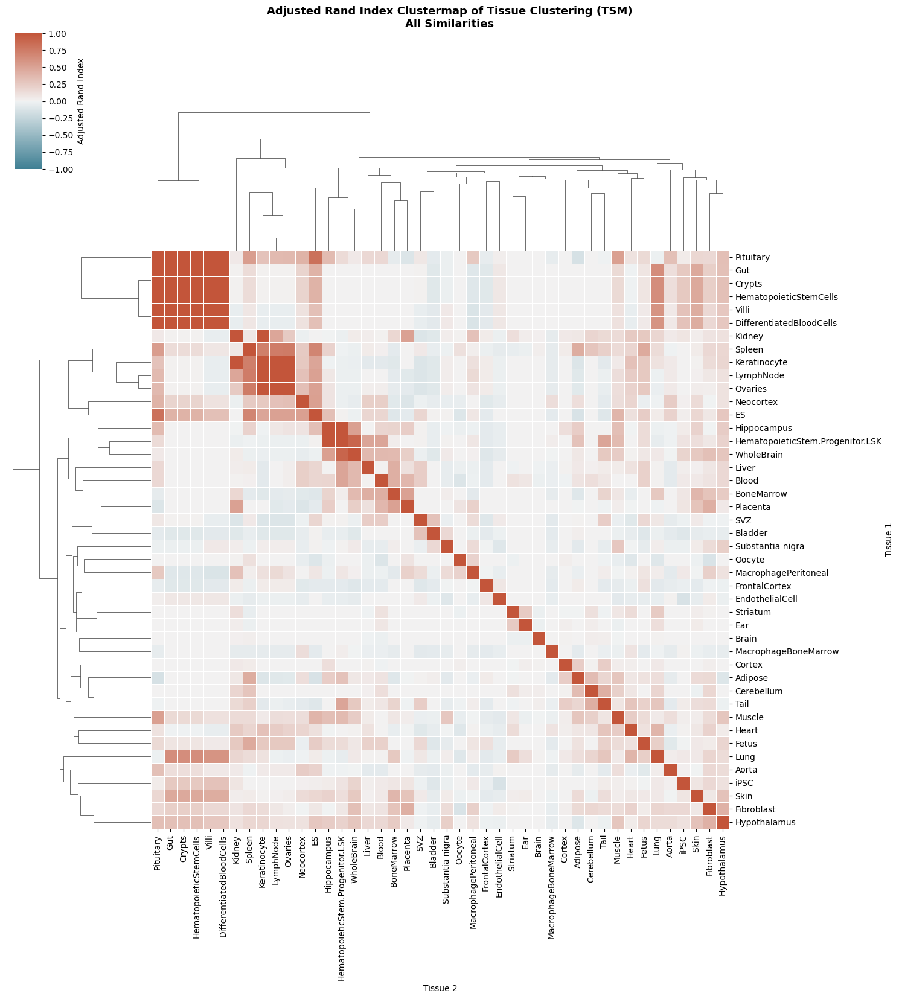

In [62]:
### Clustermap of ALL Similarities grouped by ARIs - TSM

# Create a pivot table for the clustermap
ari_pivot = similarity_results_TSM.pivot(index='Tissue 1', columns='Tissue 2', values='Adjusted Rand Index') # For complete similarity matrix

# Fill NaN values with 1.0 for self-comparisons and ensure symmetry
for tissue in best_models_TSM['Tissue'].unique():
    ari_pivot.loc[tissue, tissue] = 1.0

ari_pivot = ari_pivot.fillna(ari_pivot.T)

# Replace any remaining NaN values with a suitable value (e.g., 0)
ari_pivot = ari_pivot.fillna(0)

# Ensure x and y axis have the tissues in the same order
tissue_order = best_models_TSM['Tissue'].unique()
ari_pivot = ari_pivot.reindex(index=tissue_order, columns=tissue_order)

# Create a custom color palette
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Plot the clustermap
g = sns.clustermap(ari_pivot, 
                   cmap=cmap, 
                   figsize=(15, 15),
                   vmin=-1, vmax=1, 
                   linewidths=.5, 
                   annot=False, fmt='.2f',
                   cbar_kws={'label': 'Adjusted Rand Index', 'orientation': 'vertical', 'pad': 0.02, 'shrink': 0.5},
                   cbar_pos=(0.02, 0.92, 0.03, 0.15),  # Adjust the position of the colorbar [x, y, width, height]
                   xticklabels=ari_pivot.columns,
                   yticklabels=ari_pivot.index)  # Set figure size here

# Rotate the tick labels
plt.setp(g.ax_heatmap.yaxis.get_ticklabels(), rotation=0)
plt.setp(g.ax_heatmap.xaxis.get_ticklabels(), rotation=90)

# Set the title
plt.gcf().suptitle('Adjusted Rand Index Clustermap of Tissue Clustering (TSM)\nAll Similarities', 
                   fontsize=13, 
                   fontweight='bold', 
                   y=1.1  # Adjust the vertical position of the title, 0 is bottom, 1 is top
                   )

plt.show()


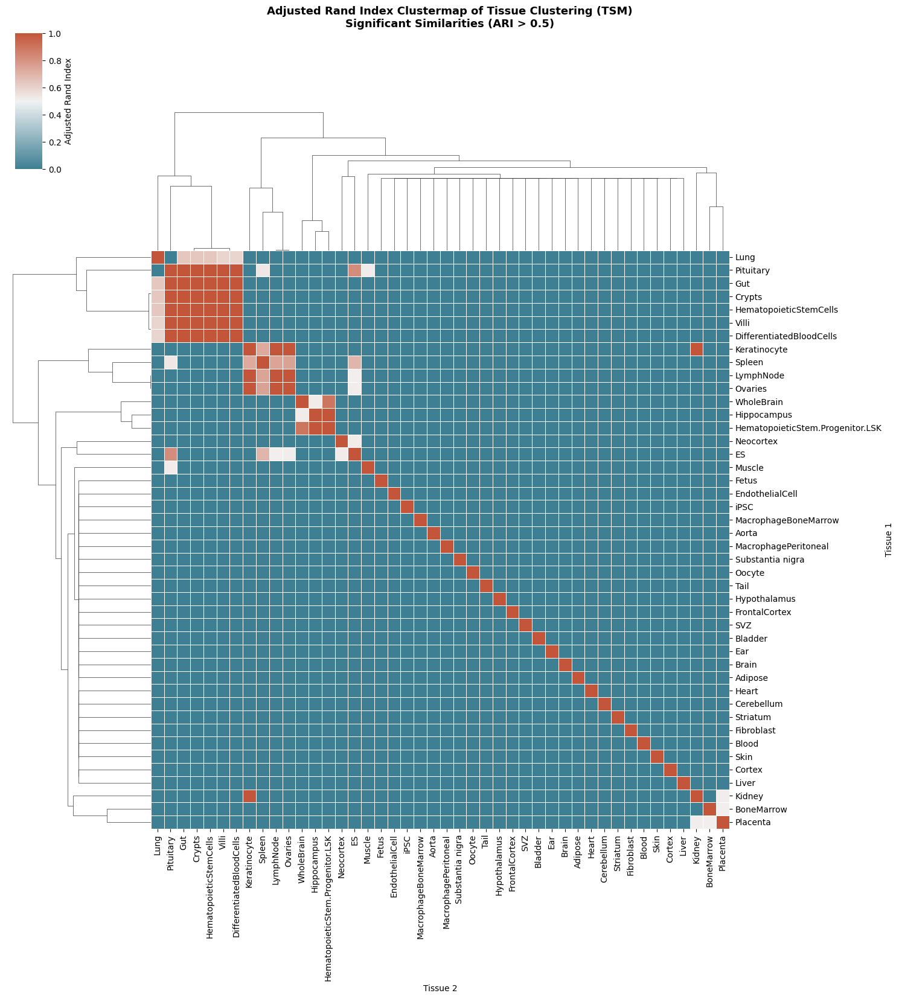

In [63]:
### Clustermap of SIGNIFICANT Similarities grouped by ARIs - TSM

# Create a pivot table for the clustermap
ari_pivot = ari_significant_similarities_TSM.pivot(index='Tissue 1', columns='Tissue 2', values='Adjusted Rand Index') # For significant similarities only

# Fill NaN values with 1.0 for self-comparisons and ensure symmetry
for tissue in best_models_TSM['Tissue'].unique():
    ari_pivot.loc[tissue, tissue] = 1.0

ari_pivot = ari_pivot.fillna(ari_pivot.T)

# Replace any remaining NaN values with a suitable value (e.g., 0)
ari_pivot = ari_pivot.fillna(0)

# Ensure x and y axis have the tissues in the same order
tissue_order = best_models_TSM['Tissue'].unique()
ari_pivot = ari_pivot.reindex(index=tissue_order, columns=tissue_order)

# Create a custom color palette
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Plot the clustermap
g = sns.clustermap(ari_pivot, 
                   cmap=cmap, 
                   figsize=(15, 15),
                   vmin=0, vmax=1, 
                   linewidths=.5, 
                   annot=False, fmt='.2f',
                   cbar_kws={'label': 'Adjusted Rand Index', 'orientation': 'vertical', 'pad': 0.02, 'shrink': 0.5},
                   cbar_pos=(0.02, 0.92, 0.03, 0.15),  # Adjust the position of the colorbar [x, y, width, height]
                   xticklabels=ari_pivot.columns,
                   yticklabels=ari_pivot.index)  # Set figure size here

# Rotate the tick labels
plt.setp(g.ax_heatmap.yaxis.get_ticklabels(), rotation=0)
plt.setp(g.ax_heatmap.xaxis.get_ticklabels(), rotation=90)

# Set the title
plt.gcf().suptitle('Adjusted Rand Index Clustermap of Tissue Clustering (TSM)\nSignificant Similarities (ARI > 0.5)', 
                   fontsize=13, 
                   fontweight='bold', 
                   y=1.1  # Adjust the vertical position of the title, 0 is bottom, 1 is top
                   )

plt.show()


In [64]:
# ### Clustermap of ALL Similarities grouped by ARIs -BOM

# # Create a pivot table for the clustermap
# ari_pivot = similarity_results_BOM.pivot(index='Tissue1', columns='Tissue2', values='Adjusted Rand Index') # For all similarities

# # Fill NaN values with 1.0 for self-comparisons and ensure symmetry
# for tissue in best_model_BOM['Tissue'].unique():
#     ari_pivot.loc[tissue, tissue] = 1.0

# ari_pivot = ari_pivot.fillna(ari_pivot.T)

# # Replace any remaining NaN values with a suitable value (e.g., 0)
# ari_pivot = ari_pivot.fillna(0)

# # ensure x and y axis have the tissues in the same order
# tissue_order = best_model_BOM['Tissue'].unique()
# ari_pivot = ari_pivot.reindex(index=tissue_order, columns=tissue_order)

# # Create a custom color palette
# cmap = sns.diverging_palette(220, 20, as_cmap=True)


# # Plot the clustermap
# g = sns.clustermap(ari_pivot, 
#                    cmap=cmap, 
#                    figsize=(15, 15),
#                    vmin=-1, vmax=1, 
#                    linewidths=.5, 
#                    annot=False, fmt='.2f',
#                    cbar_kws={'label': 'Adjusted Rand Index', 'orientation': 'vertical', 'pad': 0.02, 'shrink': 0.5},
#                    cbar_pos=(0.02, 0.92, 0.03, 0.15),  # Adjust the position of the colorbar [x, y, width, height]
#                    xticklabels=ari_pivot.columns,
#                    yticklabels=ari_pivot.index)  # Set figure size here

# # Rotate the tick labels
# plt.setp(g.ax_heatmap.yaxis.get_ticklabels(), rotation=0)
# plt.setp(g.ax_heatmap.xaxis.get_ticklabels(), rotation=90)

# # Set the title
# plt.gcf().suptitle('Adjusted Rand Index Clustermap of Tissue Clustering (BOM)\nAll Similarities', 
#                    fontsize=13, 
#                    fontweight='bold', 
#                    y=1.1  # Adjust the vertical position of the title, 0 is bottom, 1 is top
#                    )

# plt.show()

In [65]:
# ### Clustermap of SIGNIFICANT Similarities grouped by ARIs -BOM

# # Create a pivot table for the clustermap
# ari_pivot = ari_significant_similarities_BOM.pivot(index='Tissue1', columns='Tissue2', values='Adjusted Rand Index')  # For significant similarities only

# # Fill NaN values with 1.0 for self-comparisons and ensure symmetry
# for tissue in best_model_BOM['Tissue'].unique():
#     ari_pivot.loc[tissue, tissue] = 1.0

# ari_pivot = ari_pivot.fillna(ari_pivot.T)

# # Replace any remaining NaN values with a suitable value (e.g., 0)
# ari_pivot = ari_pivot.fillna(0)

# # ensure x and y axis have the tissues in the same order
# tissue_order = best_model_BOM['Tissue'].unique()
# ari_pivot = ari_pivot.reindex(index=tissue_order, columns=tissue_order)

# # Create a custom color palette
# cmap = sns.diverging_palette(220, 20, as_cmap=True)


# # Plot the clustermap
# g = sns.clustermap(ari_pivot, 
#                    cmap=cmap, 
#                    figsize=(15, 15),
#                    vmin=0, vmax=1, 
#                    linewidths=.5, 
#                    annot=False, fmt='.2f',
#                    cbar_kws={'label': 'Adjusted Rand Index', 'orientation': 'vertical', 'pad': 0.02, 'shrink': 0.5},
#                    cbar_pos=(0.02, 0.92, 0.03, 0.15),  # Adjust the position of the colorbar [x, y, width, height]
#                    xticklabels=ari_pivot.columns,
#                    yticklabels=ari_pivot.index)  # Set figure size here

# # Rotate the tick labels
# plt.setp(g.ax_heatmap.yaxis.get_ticklabels(), rotation=0)
# plt.setp(g.ax_heatmap.xaxis.get_ticklabels(), rotation=90)

# # Set the title
# plt.gcf().suptitle('Adjusted Rand Index Clustermap of Tissue Clustering (BOM)\nSignificant Similarities (ARI > 0.5)', 
#                    fontsize=13, 
#                    fontweight='bold', 
#                    y=1.1  # Adjust the vertical position of the title, 0 is bottom, 1 is top
#                    )

# plt.show()

### 5.4. Important CpGs across all tissues

Here the CpGs that are important for clustering across all tissues are identified and saved for further analysis.

In [66]:
# #### CpGs relevant in all tissues based on feature scores - Best Overall Method (BOM) [DBSCAN]

# # Initialize a list to store feature scores for each tissue
# all_feature_scores_BOM = []

# # Load feature scores for each tissue
# for tissue_name in best_model_BOM['Tissue']:
#     # Load the feature scores for the current tissue
#     feature_scores_path = Path(f'./Cluster Analysis/Clustering Results/Clock3/DBSCAN/Feature Analysis/{tissue_name}_feature_scores_without_noise_clock3.csv') ### Clock
#     feature_scores = pd.read_csv(feature_scores_path)
    
#     # Add the tissue name to the feature scores
#     feature_scores['Tissue'] = tissue_name
    
#     # Append the feature scores to the list
#     all_feature_scores_BOM.append(feature_scores)

# # Concatenate feature scores into a single DataFrame
# combined_feature_scores_BOM = pd.concat(all_feature_scores_BOM)

# # Specify the score column to use
# score_column_BOM = 'F_Score'

# # Identify CpGs relevant in all tissues based on a threshold_BOM (e.g., top 10% of scores)
# percentage = 0.99
# threshold_BOM = combined_feature_scores_BOM[score_column_BOM].quantile(percentage)
# relevant_cpgs_BOM = combined_feature_scores_BOM[combined_feature_scores_BOM[score_column_BOM] >= threshold_BOM]['CpG']

# relevant_cpgs_BOM = relevant_cpgs_BOM.unique()

# print(f"Relevant CpGs in all tissues based on {score_column_BOM}: {relevant_cpgs_BOM.tolist()}")

In [67]:
# print(f'Using the best overall model applied to all tissue datasets, the number of relevant CpGs identified based on a threshold of {percentage} was {len(relevant_cpgs_BOM)} out of 335 (Combined: {combined_feature_scores_BOM.shape[0]})')

In [88]:
#### CpGs relevant in all tissues based on feature scores - Tissue-Specific Models (TSM)

# Initialize a list to store feature scores for each tissue
all_feature_scores_TSM = []

for _, row in best_models_TSM.iterrows():
    tissue_name = row['Tissue']
    best_method = row['Best_Method']
    
    # Set the path based on the best method
    if best_method == 'kmeans':
        feature_scores_path = Path(f'./Cluster Analysis/Clustering Results/Clock3/KM/Feature Analysis/{tissue_name}_feature_scores_clock3.csv') ### Clock
    elif best_method == 'hierarchical':
        feature_scores_path = Path(f'./Cluster Analysis/Clustering Results/Clock3/HC/Feature Analysis/{tissue_name}_feature_scores_clock3.csv') ### Clock
    elif best_method == 'dbscan':
        feature_scores_path = Path(f'./Cluster Analysis/Clustering Results/Clock3/DBSCAN/Feature Analysis/{tissue_name}_feature_scores_without_noise_clock3.csv') ### Clock

    # Load the feature scores for the current tissues
    if feature_scores_path.exists():
        feature_scores = pd.read_csv(feature_scores_path)
        
        # Add the tissue name to the feature scores
        feature_scores['Tissue'] = tissue_name
        
        # Append the feature scores to the list
        all_feature_scores_TSM.append(feature_scores)
    else:
        print(f"File not found: {feature_scores_path}")

# Concatenate feature scores into a single DataFrame
combined_feature_scores_TSM = pd.concat(all_feature_scores_TSM)

# Specify the score column to use
score_column_TSM = 'F_Score'

# Identify CpGs relevant in all tissues based on a threshold (e.g., top 10% of scores)
percentage = 0.90 # Top 10% of scores
threshold_TSM = combined_feature_scores_TSM[score_column_TSM].quantile(percentage) #
relevant_cpgs_TSM = combined_feature_scores_TSM[combined_feature_scores_TSM[score_column_TSM] >= threshold_TSM]['CpG']

relevant_cpgs_TSM = relevant_cpgs_TSM.unique()

print(f"Relevant CpGs in all tissues based on {score_column_TSM}: {relevant_cpgs_TSM.tolist()}")


Relevant CpGs in all tissues based on F_Score: ['cg06679388', 'cg00422680', 'cg09008979', 'cg09010707', 'cg05844937', 'cg26957053', 'cg18894136', 'cg14361875', 'cg12967137', 'cg18679961', 'cg07547549', 'cg08212459', 'cg21602520', 'cg03708116', 'cg00535482', 'cg07978738', 'cg21871906', 'cg24856447', 'cg20100200', 'cg15471501', 'cg13608832', 'cg18304538', 'cg07323940', 'cg06472065', 'cg26709300', 'cg05111574', 'cg23087015', 'cg15702573', 'cg18060631', 'cg11677981', 'cg25639084', 'cg02270238', 'cg00817637', 'cg13313332', 'cg10042482', 'cg11948733', 'cg00296110', 'cg05844902', 'cg24393114', 'cg27300575', 'cg23287176', 'cg21086539', 'cg09474015', 'cg16986738', 'cg24713486', 'cg08662919', 'cg27088374', 'cg17942396', 'cg16925789', 'cg12307242', 'cg19319735', 'cg10381180', 'cg03663497', 'cg18974733', 'cg05866252', 'cg15571405', 'cg02909927', 'cg25140691', 'cg16867657', 'cg12981876', 'cg08570512', 'cg05506474', 'cg26869371', 'cg21621248', 'cg18468088', 'cg18094982', 'cg23126309', 'cg07005811', 

In [89]:
print(f'Using the best tissue specific model applied to respective dataset, the number of relevant CpGs identified based on a threshold of {percentage} was {len(relevant_cpgs_TSM)} out of 760 (Combined: {combined_feature_scores_TSM.shape[0]})')

Using the best tissue specific model applied to respective dataset, the number of relevant CpGs identified based on a threshold of 0.9 was 705 out of 760 (Combined: 33440)


In [90]:
print(f'Number of non unique CpGs: {clock3.shape[0]- len(relevant_cpgs_TSM)}')

Number of non unique CpGs: 55


In [92]:
### CpG ranking based on consistent importance across tissues - TSM

# Group the feature scores by CpG and tissue
grouped_scores = combined_feature_scores_TSM.groupby('CpG')

# Function to identify tissue-specific methylation
def is_tissue_specific(group, threshold):
    high_score_tissues = group[group[score_column_TSM] >= threshold]['Tissue'].tolist()
    return len(high_score_tissues) == 1  # True if only one tissue has a high score

# Identify tissue-specific CpGs
tissue_specific_cpgs = {}
for cpg, group in grouped_scores:
    threshold = group[score_column_TSM].quantile(percentage)
    if is_tissue_specific(group, threshold):
        high_score_tissue = group[group[score_column_TSM] >= threshold]['Tissue'].iloc[0]
        if high_score_tissue not in tissue_specific_cpgs:
            tissue_specific_cpgs[high_score_tissue] = []
        tissue_specific_cpgs[high_score_tissue].append(cpg)

# Print results

for tissue, cpgs in tissue_specific_cpgs.items():
    print(f"Tissue-specific CpGs for {tissue}: {cpgs}")
if len(tissue_specific_cpgs) == 0:
    print("No tissue-specific CpGs found.")

No tissue-specific CpGs found.


In [71]:
# # check if there are any overlapped CpGs
# overlapped_cpgs = set(relevant_cpgs_BOM).intersection(relevant_cpgs_TSM)
# print(f"Number of overlapped CpGs between BOM and TSM: {len(overlapped_cpgs)}")

In [72]:
# # Save the relevant CpGs to a file

# folder = 'Cluster Analysis/Clustering Results/Clock3/Relevant CpGs'
# os.makedirs(folder, exist_ok=True)

# relevant_cpgs_file = os.path.join(folder, 'relevant_cpgs_clock3.csv')
# pd.DataFrame(relevant_cpgs_TSM).to_csv(relevant_cpgs_file, index=False)